# Setup

## Define Input & Free Parameters

In [1]:
fname = 'img/lightning.jpg'
max_power_2_sigma = 5
max_radius = 6
membrane_kernel_size = 19
max_shift = 1
persistence_coarse = 10
persistence_fine = 0.5

## Imports

In [2]:
import matplotlib.pyplot as plt
from skimage import io, filters, morphology, restoration, feature, transform
from sklearn import ensemble, svm, model_selection, neighbors, linear_model, gaussian_process, neural_network 
import numpy as np
from read_msc import *
from scipy import ndimage, stats
from ipywidgets import widgets, interact
import subprocess
import os
import sys

/home/maljovec/anaconda3/envs/regulus/lib/python3.7/site-packages/sklearn/ensemble/weight_boosting.py:29: DeprecationWarning: numpy.core.umath_tests is an internal NumPy module and should not be imported. It will be removed in a future NumPy release.
  from numpy.core.umath_tests import inner1d


## Pretty Colors

In [3]:
light_red = '#fbb4ae'
red = '#e41a1c'

light_blue = '#b3cde3'
blue = '#377eb8'

light_green = '#ccebc5'
green = '#4daf4a'

light_purple = '#decbe4'
purple = '#984ea3'

light_orange = '#fed9a6'
orange = '#ff7f00'

light_palette = [light_red, light_blue, light_green, light_purple, light_orange]
bold_palette = [red, blue, green, purple, orange]

## Reusable Variables and Functions

In [4]:
def show_image(image):
    plt.figure(num=None, dpi=200)
    plt.imshow(image, cmap=plt.cm.Greys_r)

def show_training_samples(image, in_samples, out_samples):
    show_image(image)
    plt.scatter(in_samples[:, 0], in_samples[:, 1], color=orange, s=1, marker=',')
    plt.scatter(out_samples[:, 0], out_samples[:, 1], color=purple, s=1, marker=',')
    
classifiers = {}

# Feature Generation

## Load Test Image

/home/maljovec/anaconda3/envs/regulus/lib/python3.7/site-packages/skimage/io/_io.py:54: UserWarning: `flatten` has been deprecated in favor of `as_gray` and will be removed in v0.16.
  warn('`flatten` has been deprecated in favor of `as_gray`'


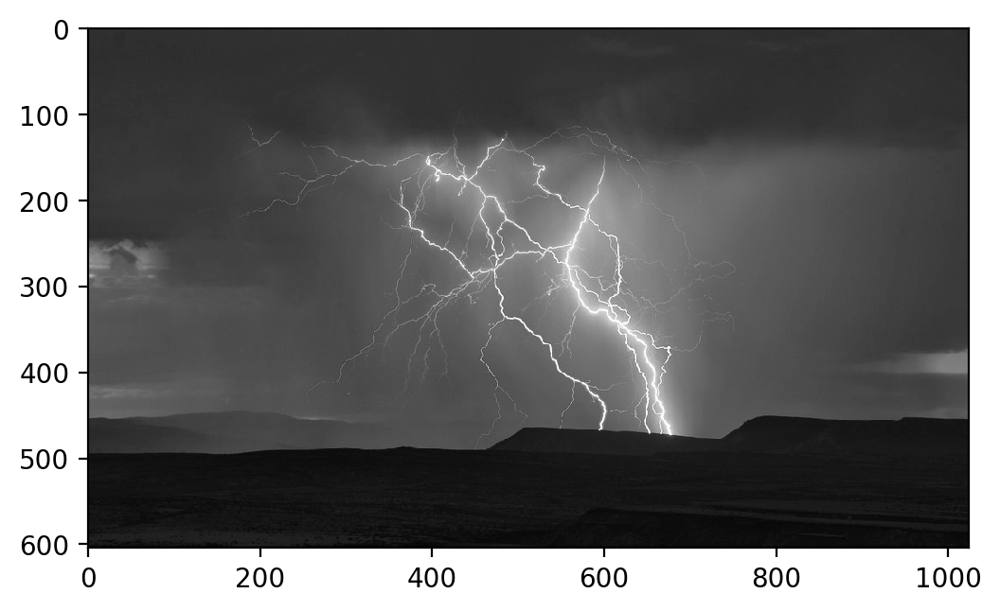

In [5]:
# Google is using an older version of skimage, we need to use "flatten" instead
# of "as_gray." I am leaving both for enhanced compatibility
image = io.imread(fname, as_gray=True, flatten=True)
show_image(image)

## Smooth the Test Image

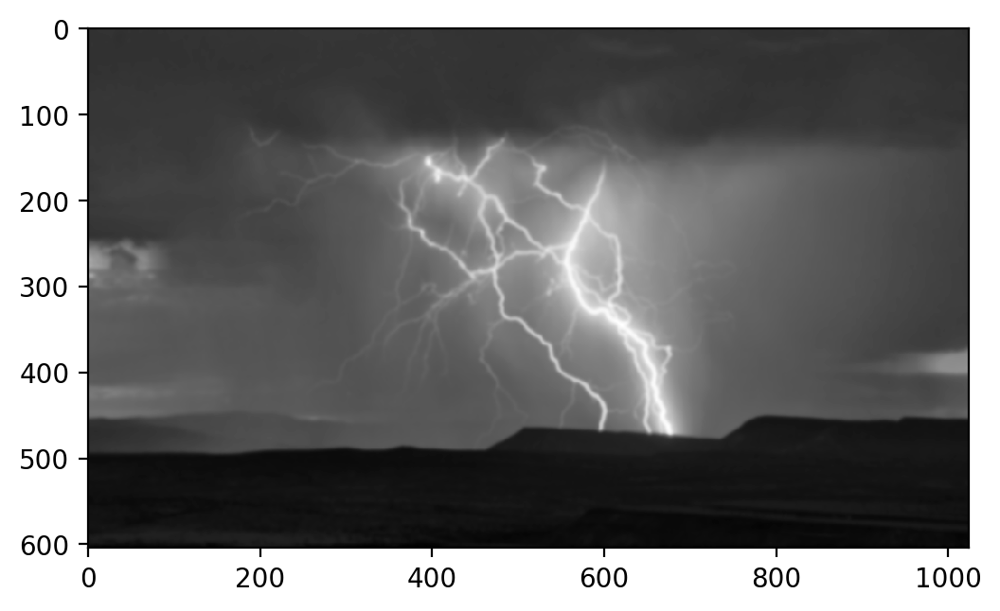

In [6]:
blurred_image = filters.gaussian(image, sigma=2**1)
plt.figure(num=None, dpi=200)
plt.imshow(blurred_image, cmap=plt.cm.Greys_r)
fname_raw = fname.rsplit('.', 1)[0] + '_smoothed.raw'
blurred_image.astype('float32').tofile(fname_raw)
image = blurred_image

## Look at Some Info about the Image

This will be useful later on to look to set the initial persistence threshold of the Morse-Smale Complex construction.

(604, 1024)
0.05326489785831394 0.8655970473254249


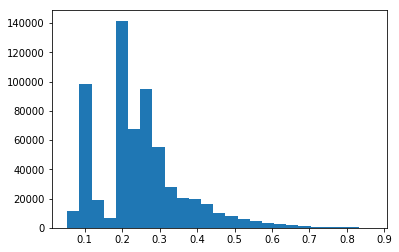

In [7]:
print(image.shape)
print(np.min(image.flatten()), np.max(image.flatten()))

# To generate input file for MSCVisus:
# image.astype('float32').tofile('lightning_smoothed.raw')

_ = plt.hist(image.flatten(), 25)

## Create Features by Creating/Applying Filters

### Gaussian Blur

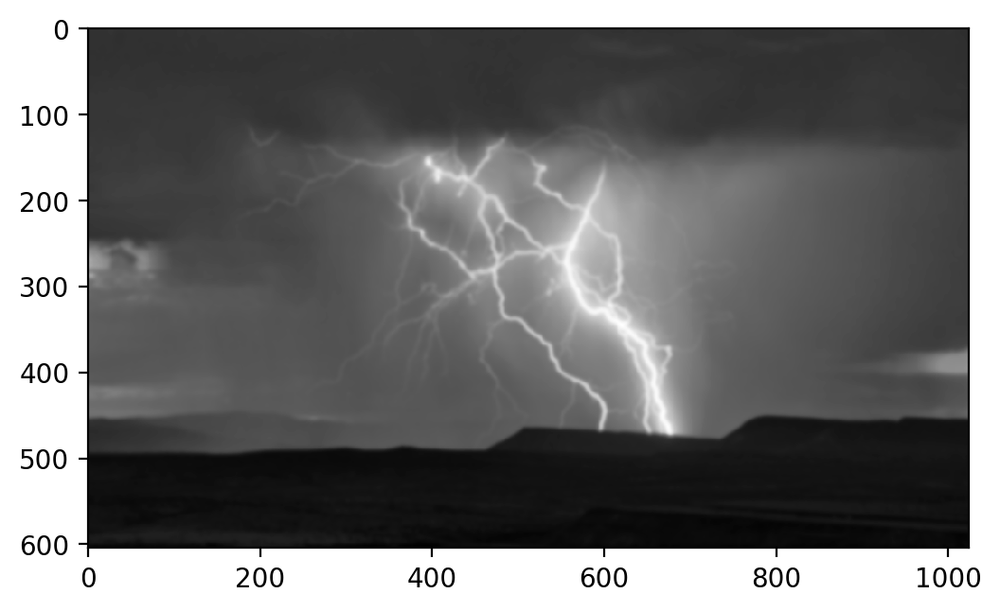

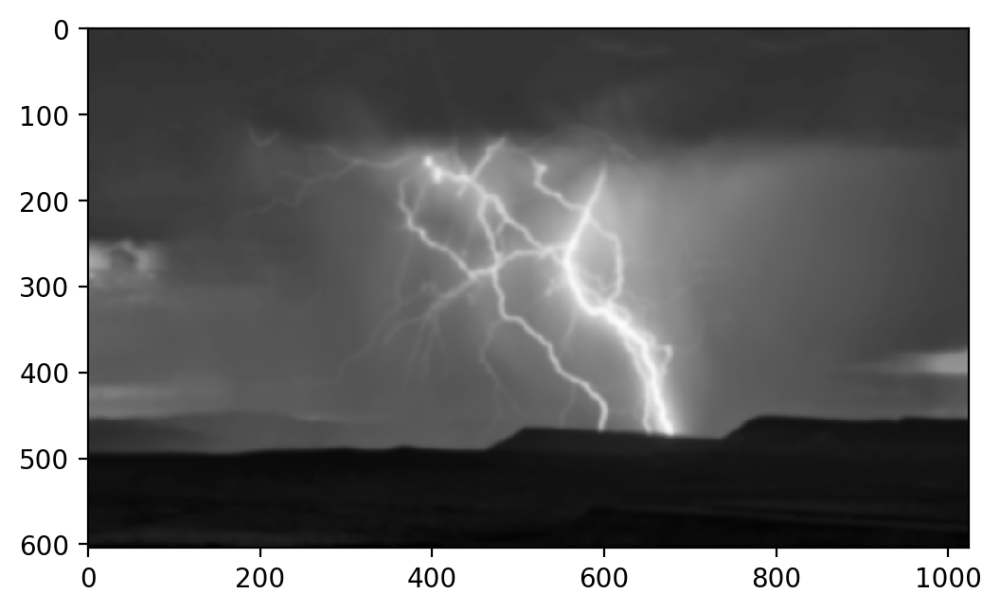

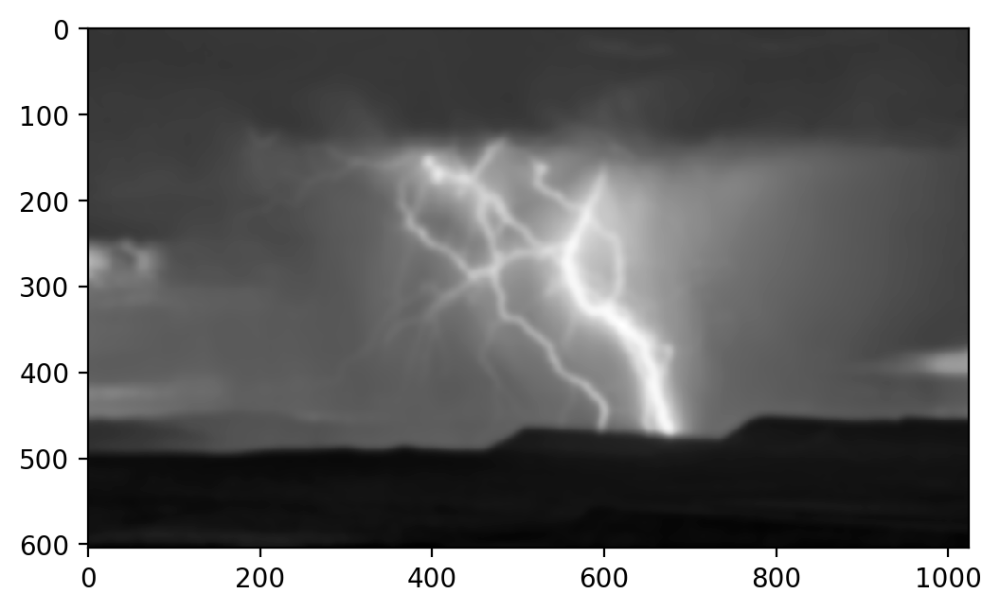

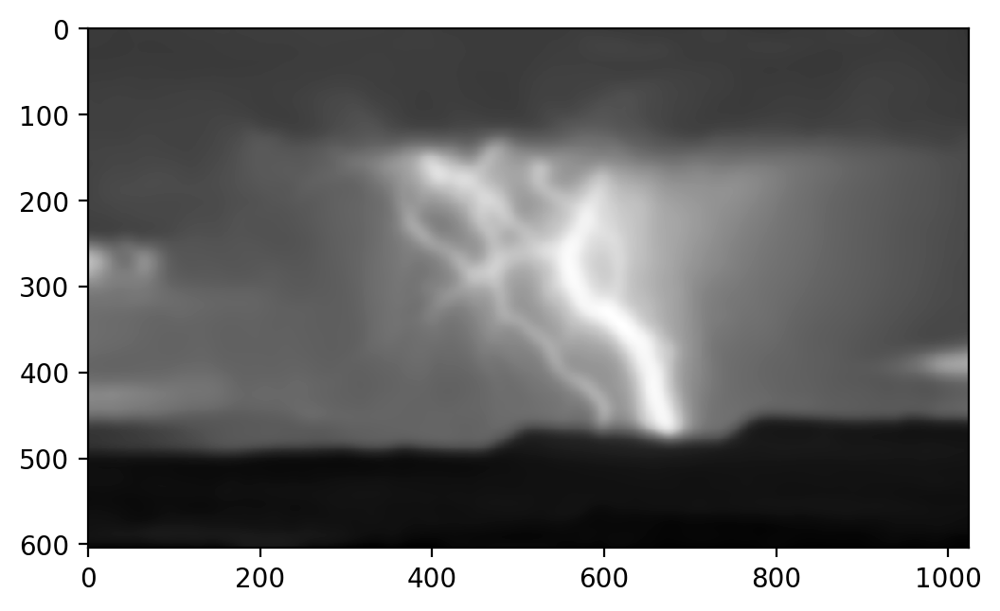

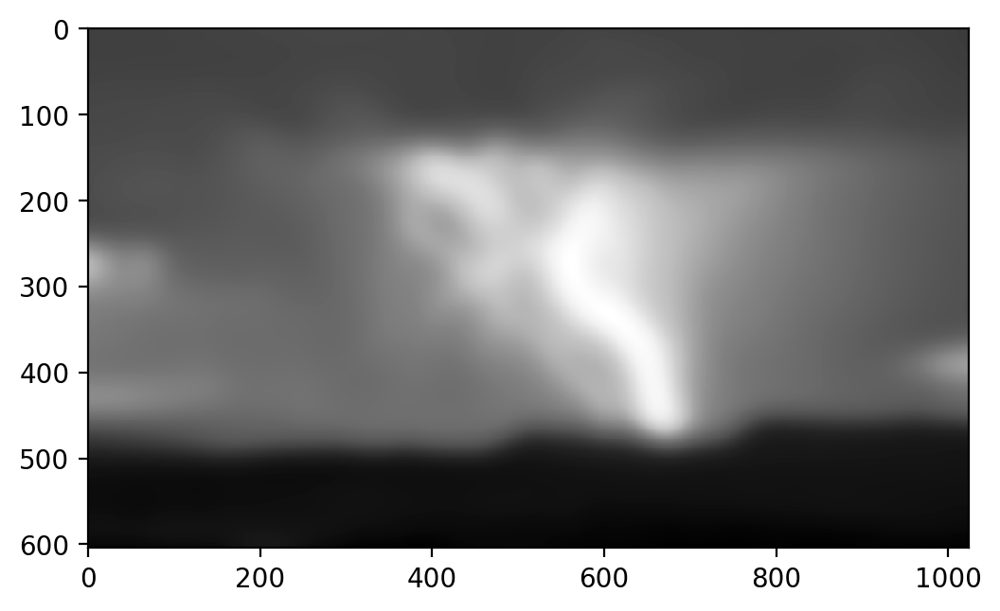

In [8]:
blur_images = []
for i in range(0, max_power_2_sigma):
    blur_images.append(filters.gaussian(image, sigma=2**i))
    
for blur_image in blur_images:
    show_image(blur_image)

### Difference of Gaussians

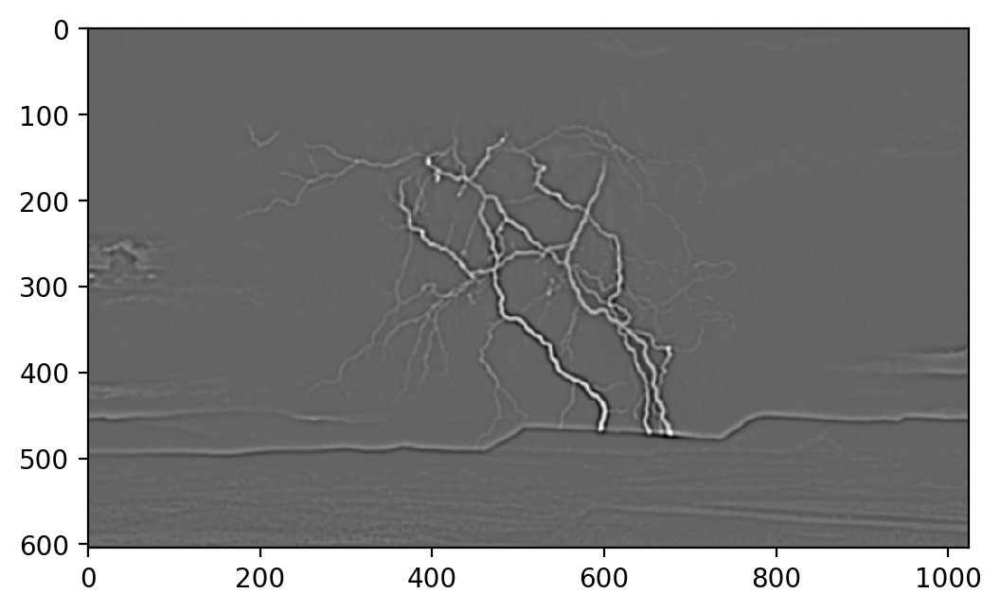

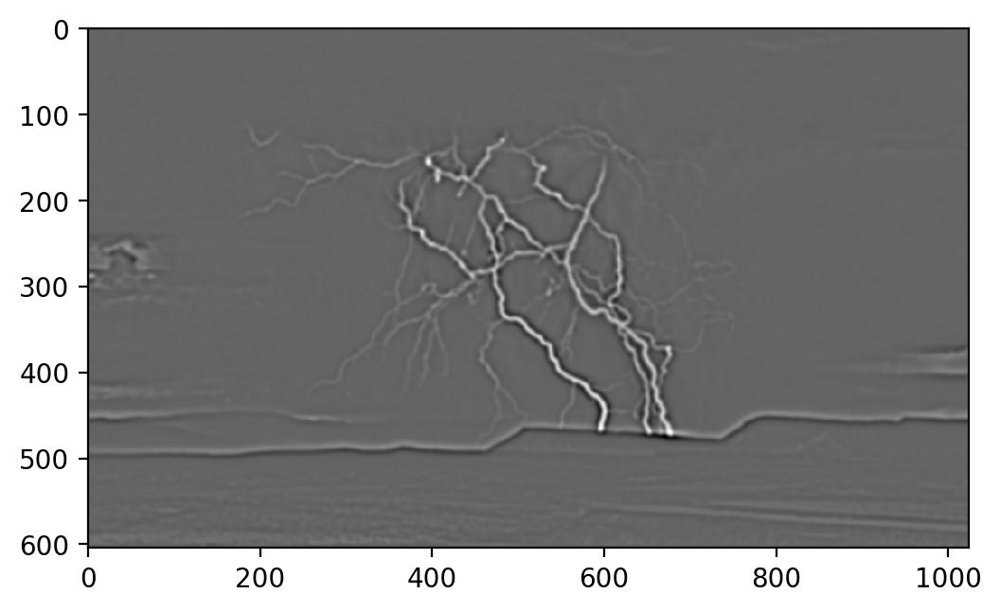

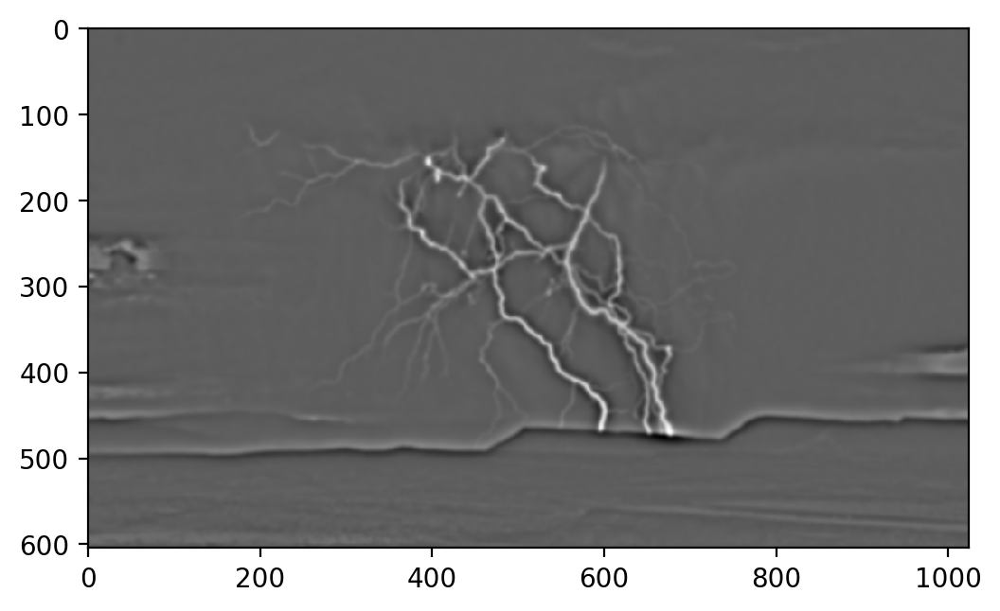

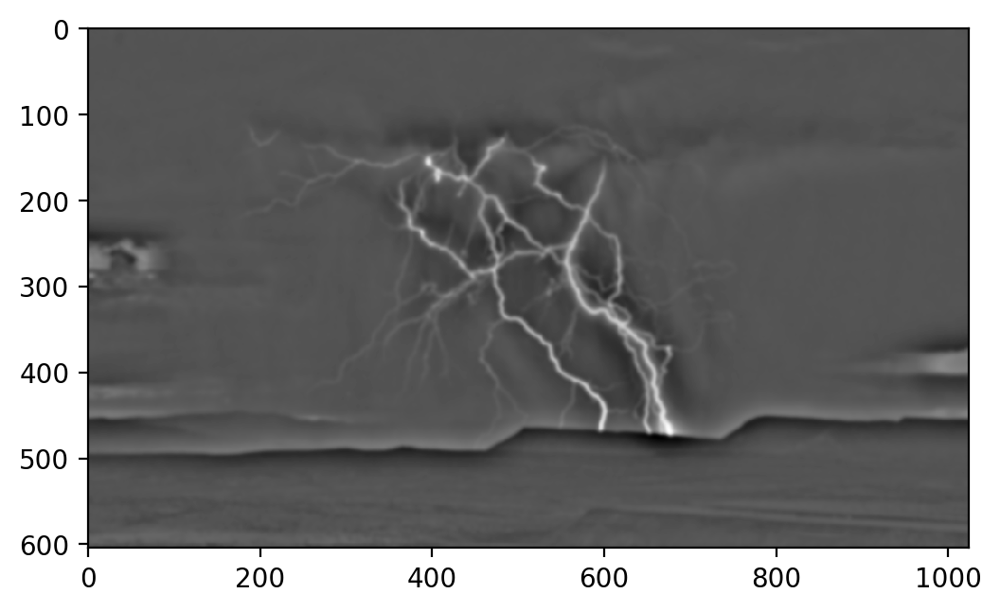

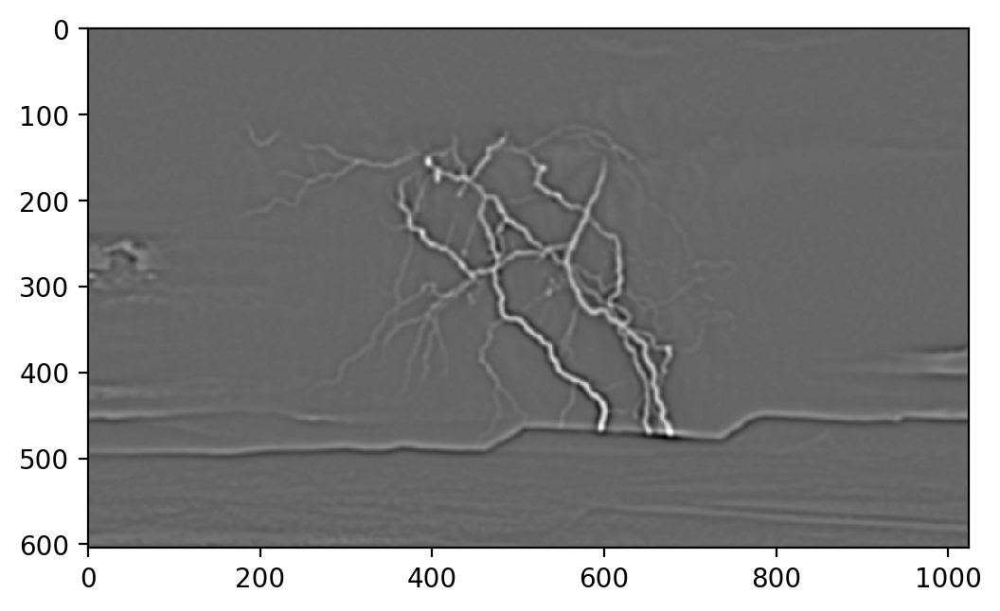

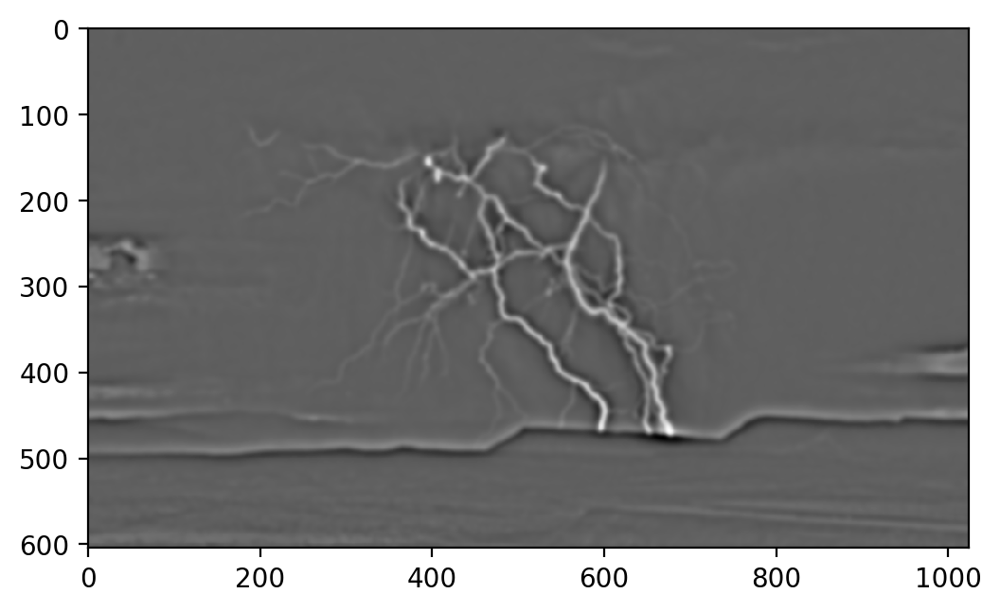

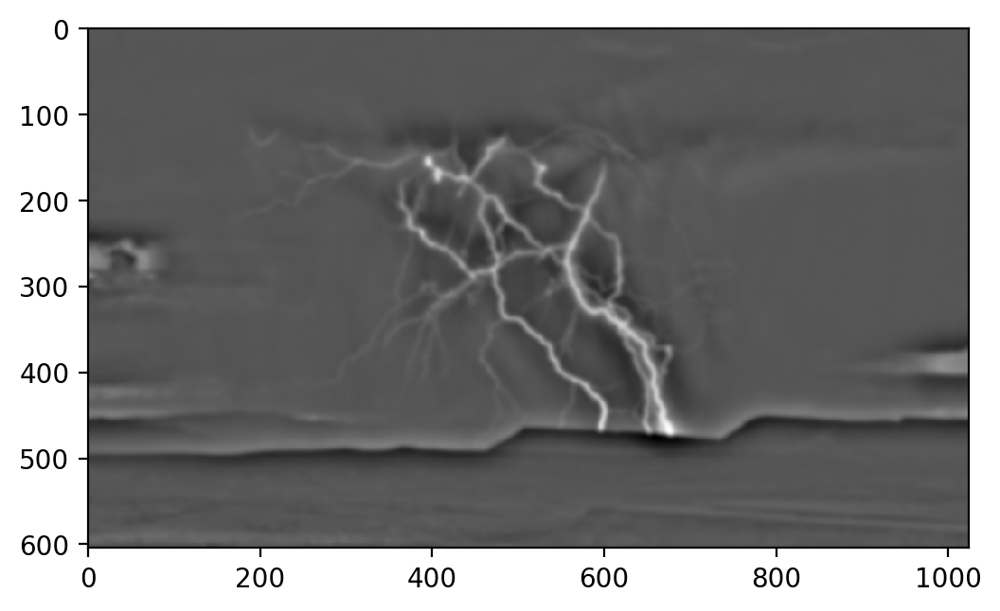

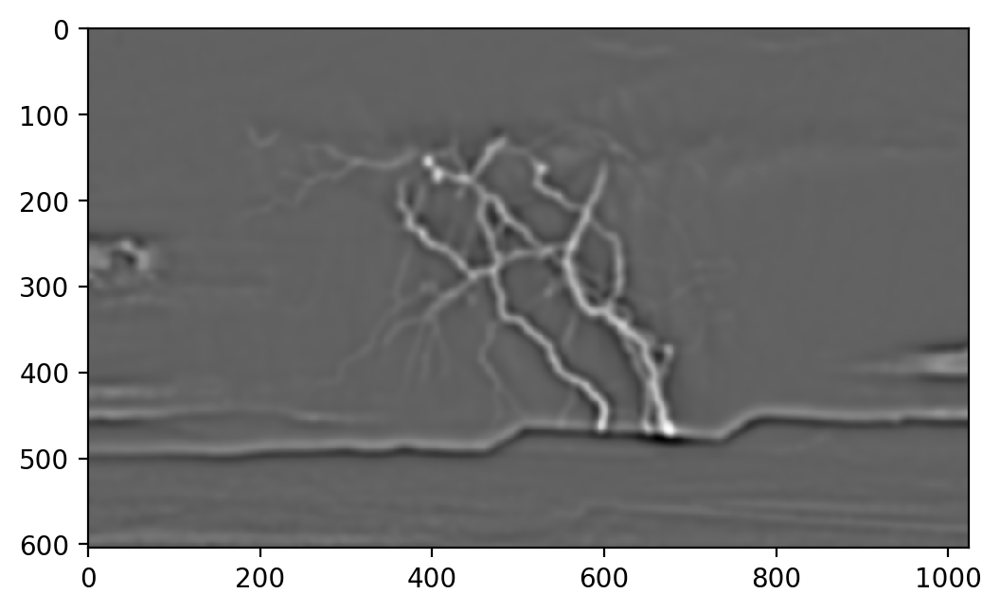

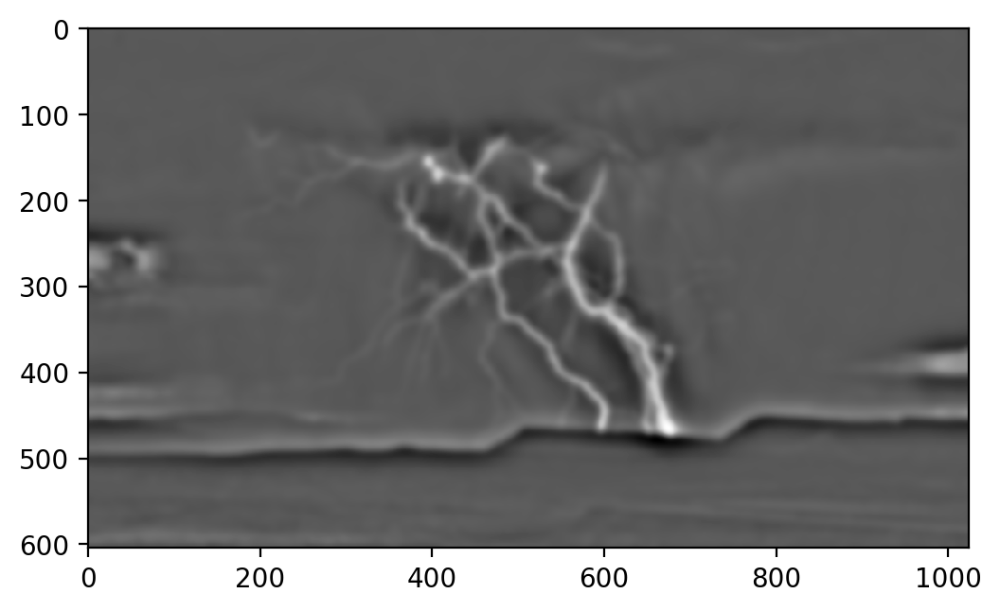

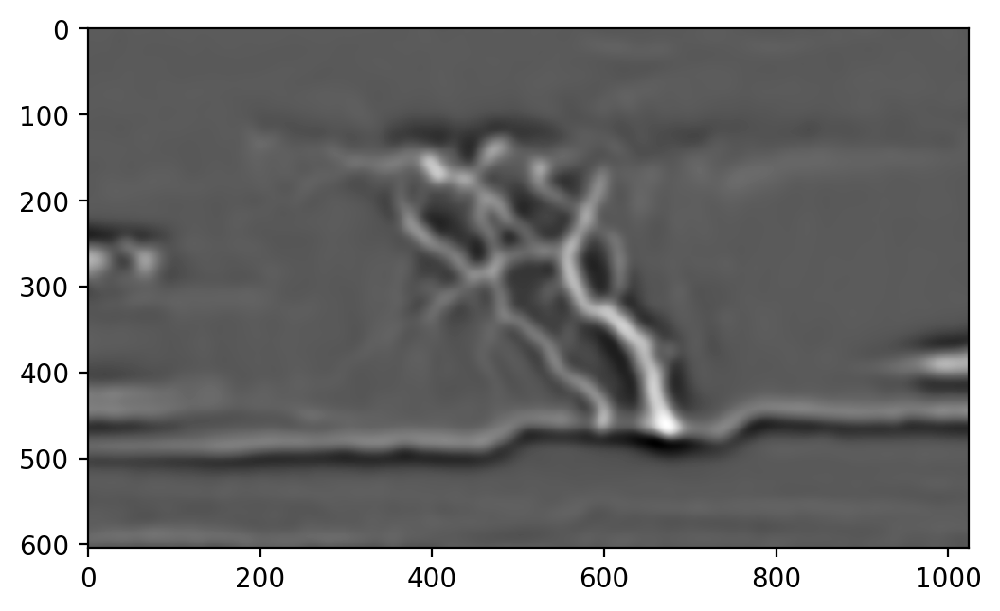

In [9]:
diff_images = []
for i, blur in enumerate(blur_images):
    for blur2 in blur_images[i+1:]:
        diff_images.append(blur-blur2)

for diff_image in diff_images:
    show_image(diff_image)

### Membrane Projections

In [10]:
membrane_kernel = np.zeros((membrane_kernel_size, membrane_kernel_size))
membrane_kernel[:, membrane_kernel_size//2] = 1.

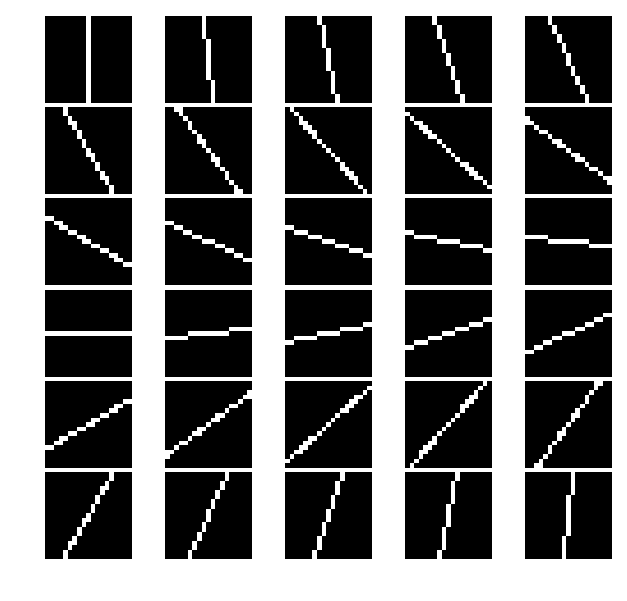

In [11]:
# Create the 30 test kernels from the base kernel and look at them to make sure that they make sense
test_kernels = []

fig, ax = plt.subplots(6, 5, figsize=(5, 6), dpi=120)
fig.subplots_adjust(left=0.0, right=1, hspace=0.05, wspace=0)
ax = ax.flatten()
for i, angle in enumerate(range(0, 180, 6)):
    test_kernels.append(transform.rotate(membrane_kernel, angle, resize=False, center=None, order=0, mode='edge', clip=True, preserve_range=True))
    ax[i].imshow(test_kernels[i], cmap=plt.cm.Greys_r)
    ax[i].axis('off')

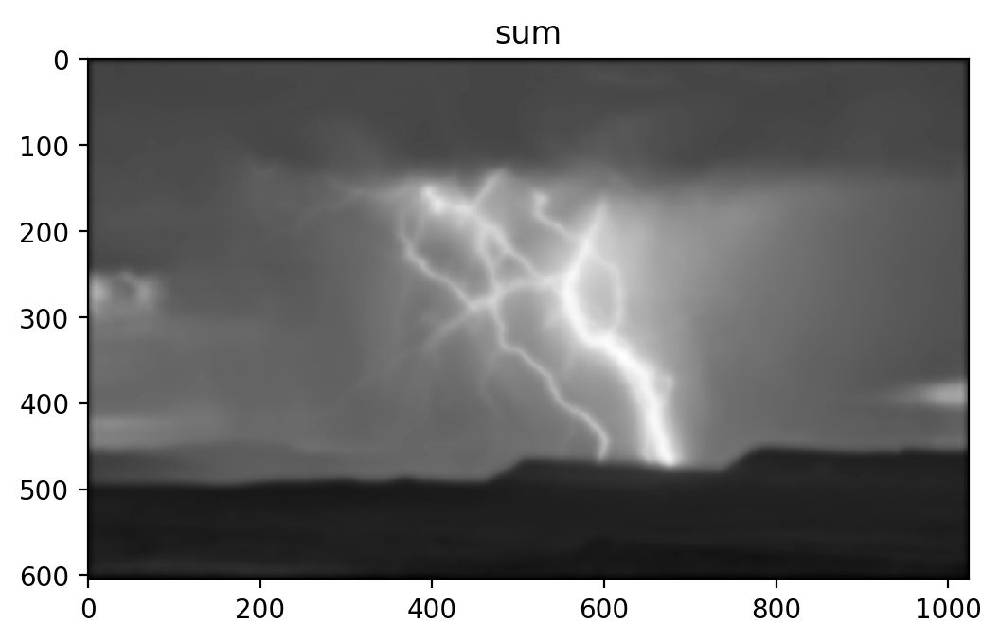

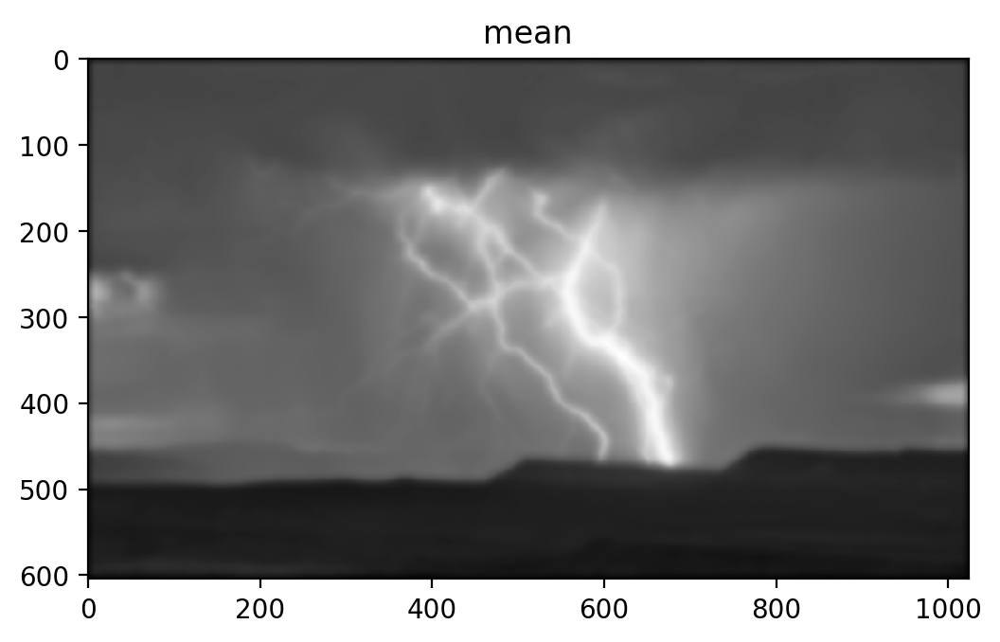

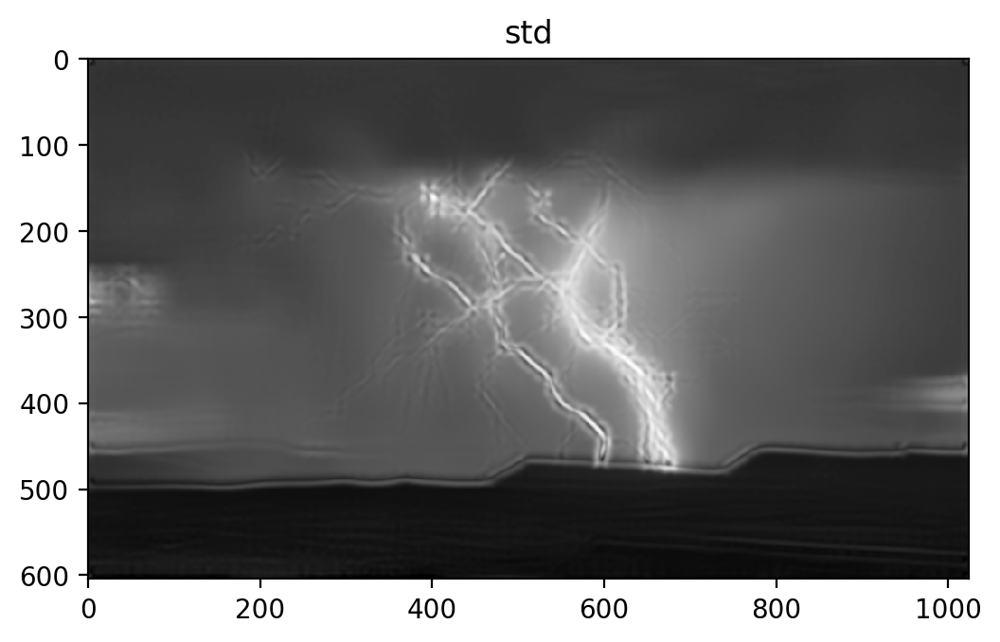

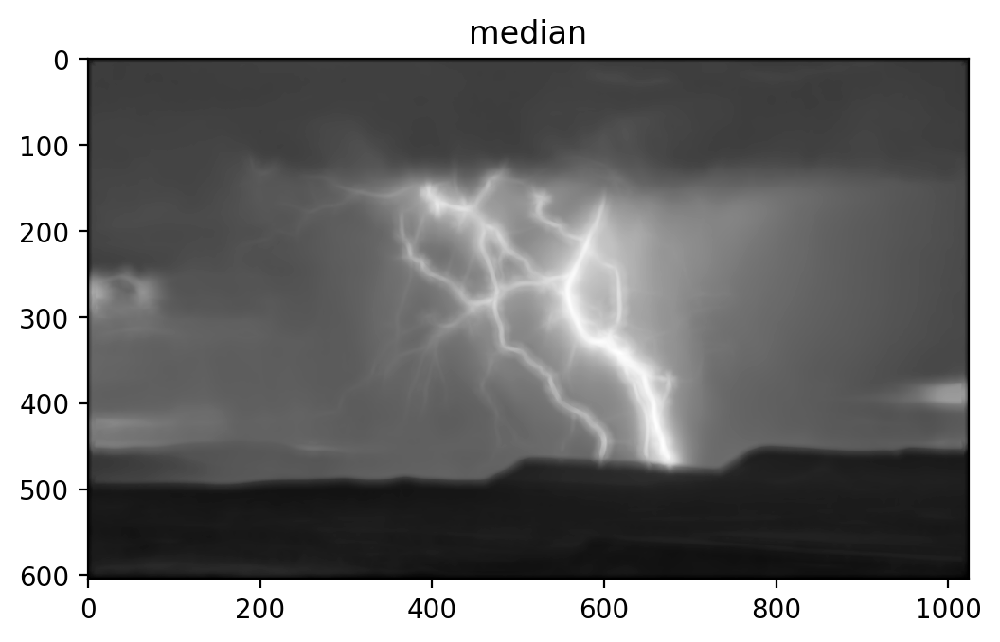

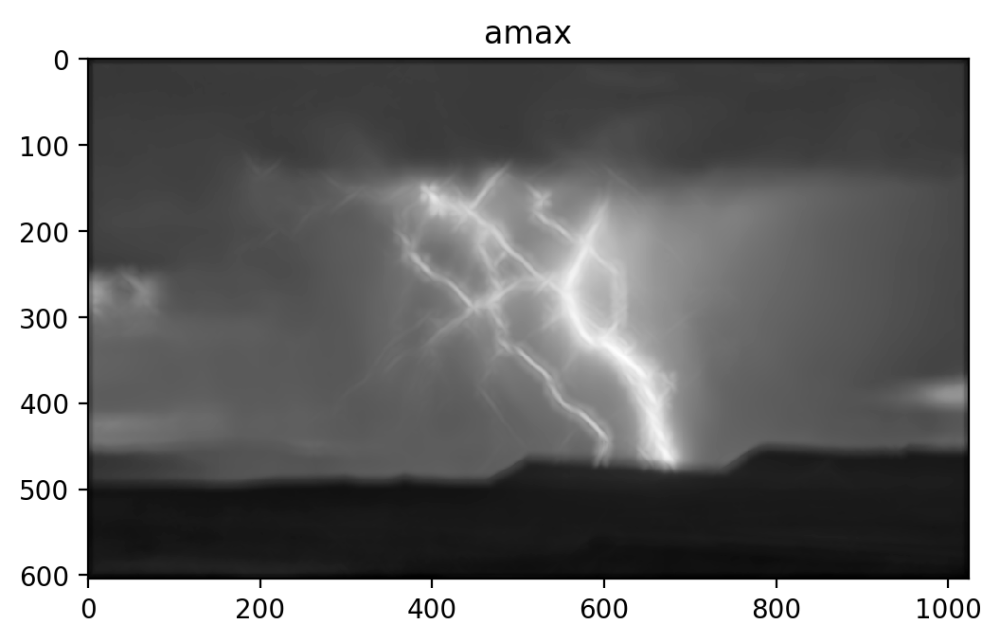

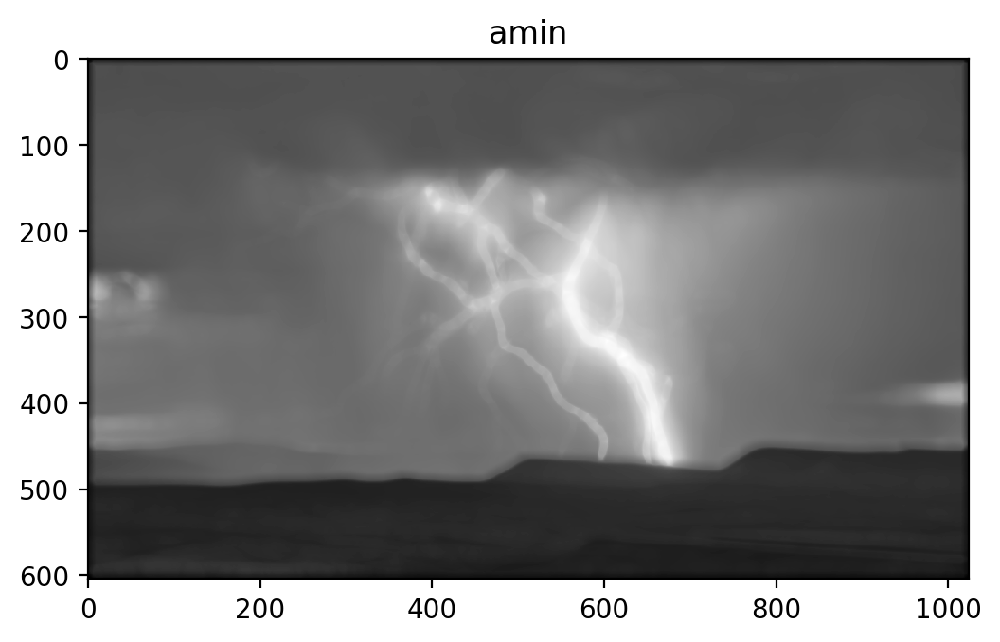

In [12]:
test_images = []
for test_kernel in test_kernels:
    test_images.append(ndimage.filters.convolve(image, test_kernel, mode='constant', cval=0))

stacked_images = np.dstack(tuple(test_images))
membrane_projection_images = []
names = []
for foo in [np.sum, np.mean, np.std, np.median, np.max, np.min]:
    membrane_projection_images.append(foo(stacked_images, axis=2))
    names.append(foo.__name__)

for title, membrane_projection_image in zip(names, membrane_projection_images):
    show_image(membrane_projection_image)
    plt.gca().set_title(title)

### Sobel Filter

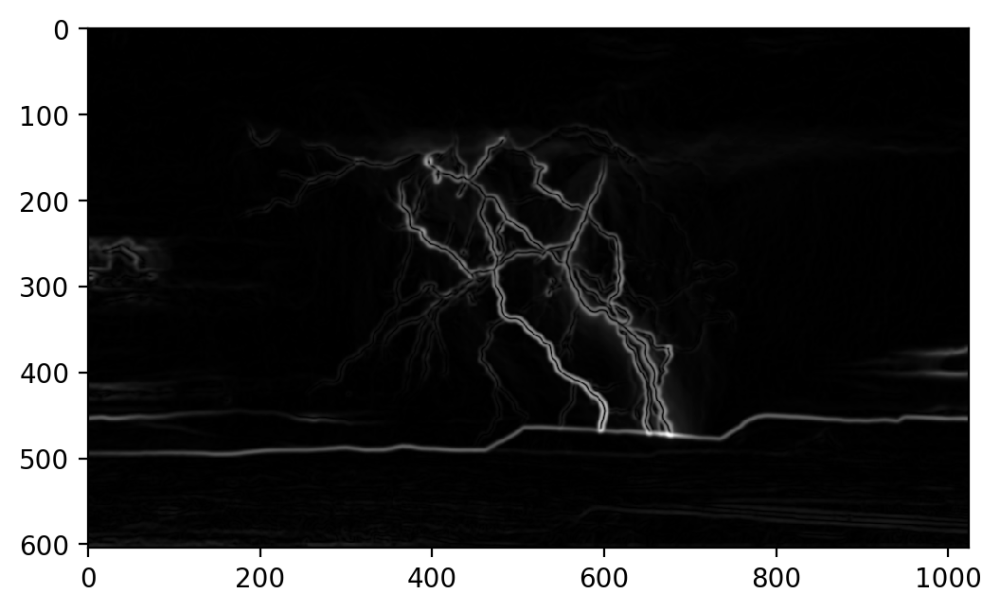

In [13]:
sobel_image = filters.sobel(image)
show_image(sobel_image)

### Hessian Filter

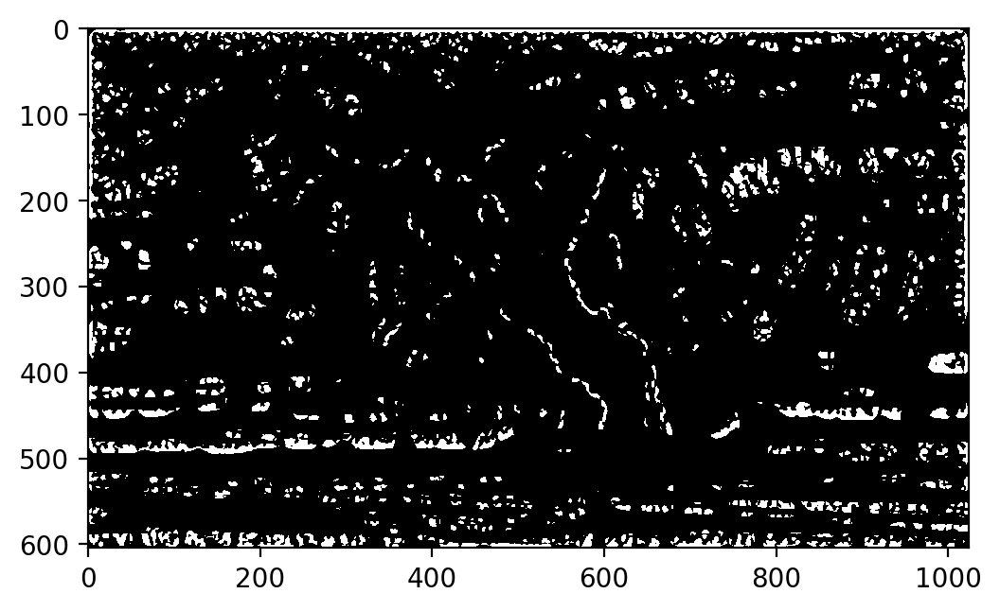

In [14]:
hessian_image = filters.hessian(image)
show_image(hessian_image)

### Mean Filter

/home/maljovec/anaconda3/envs/regulus/lib/python3.7/site-packages/skimage/util/dtype.py:130: UserWarning: Possible precision loss when converting from float64 to uint8
  .format(dtypeobj_in, dtypeobj_out))


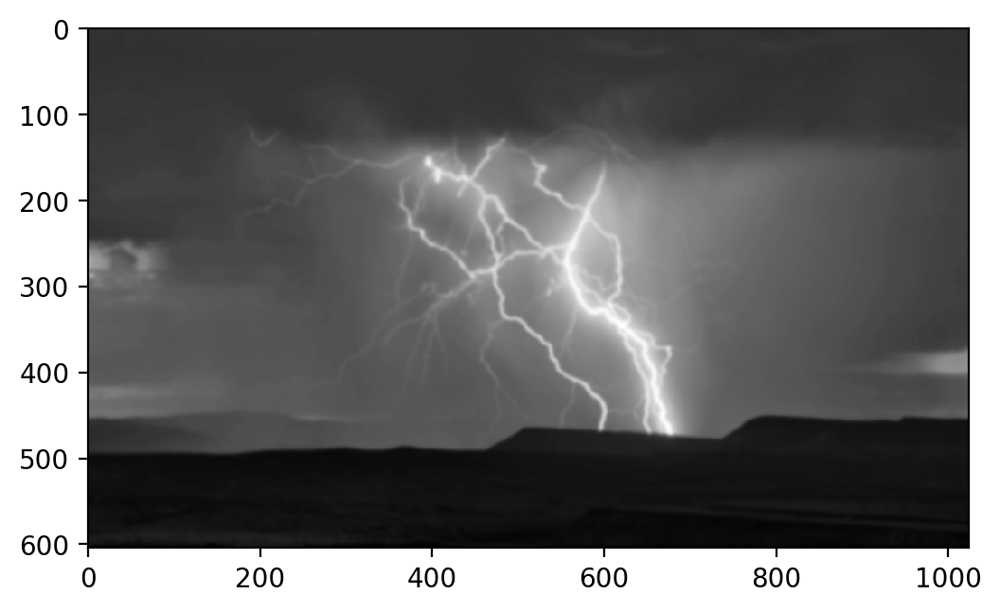

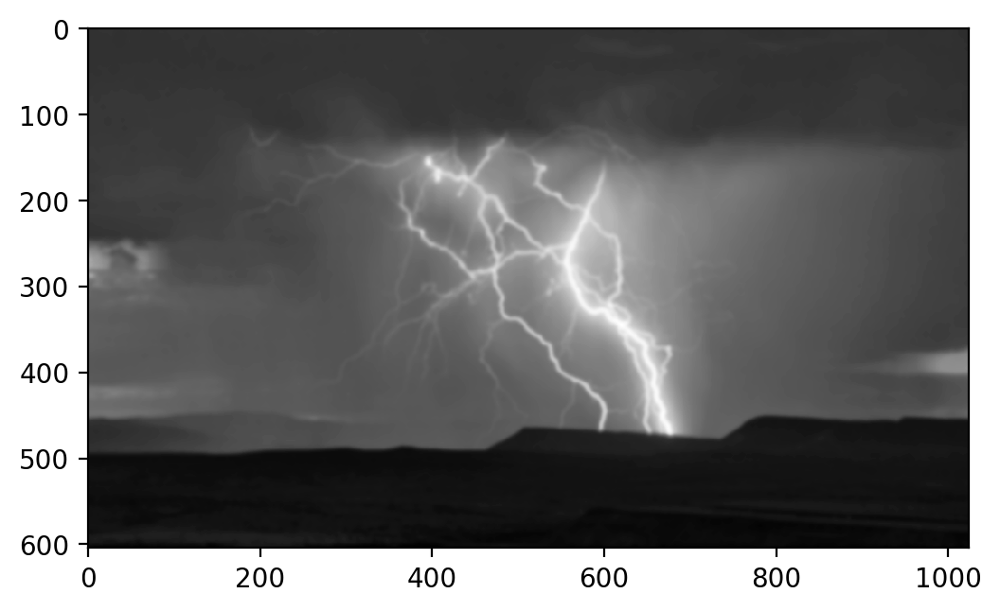

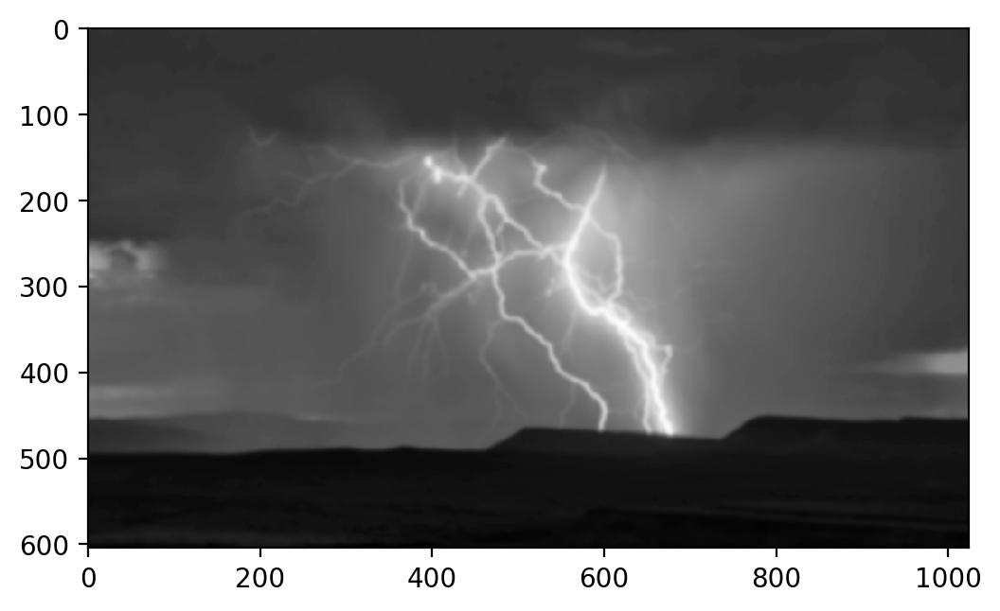

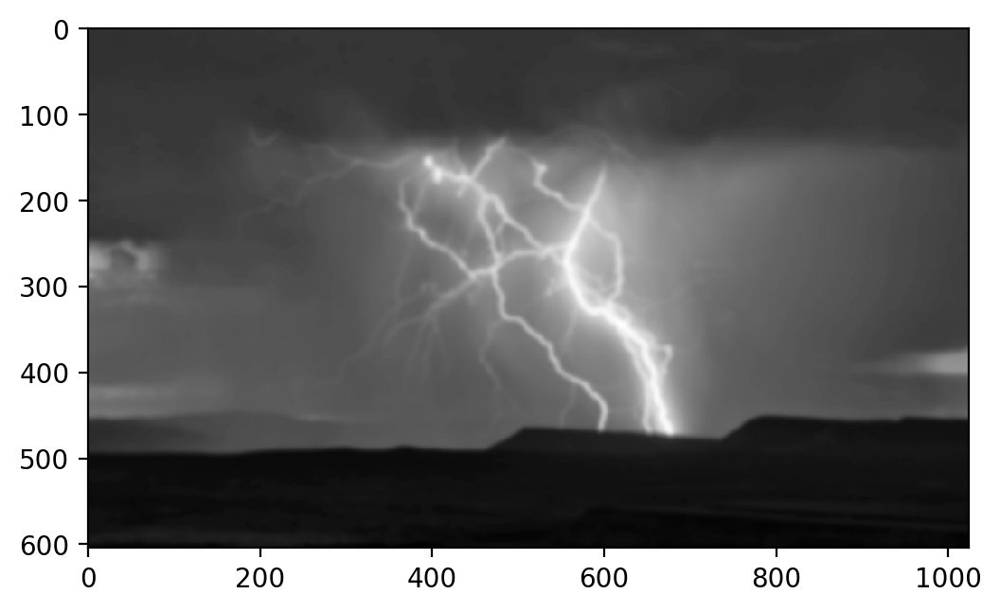

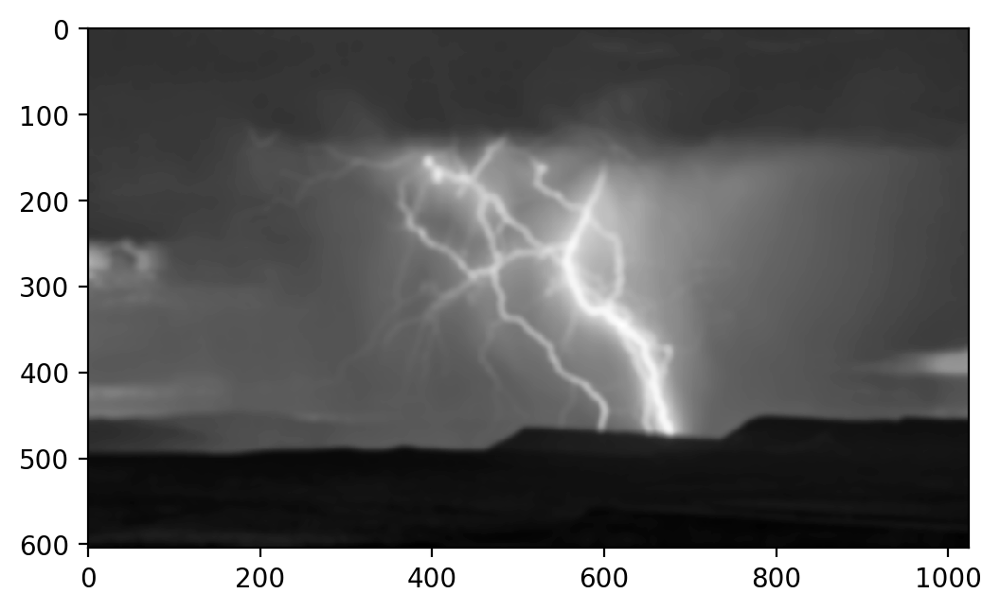

In [15]:
mean_images = []
for i in range(1, max_radius):
    mean_images.append(filters.rank.mean(image, selem=morphology.disk(i)))

for mean_image in mean_images:
    show_image(mean_image)

### Variance Filter

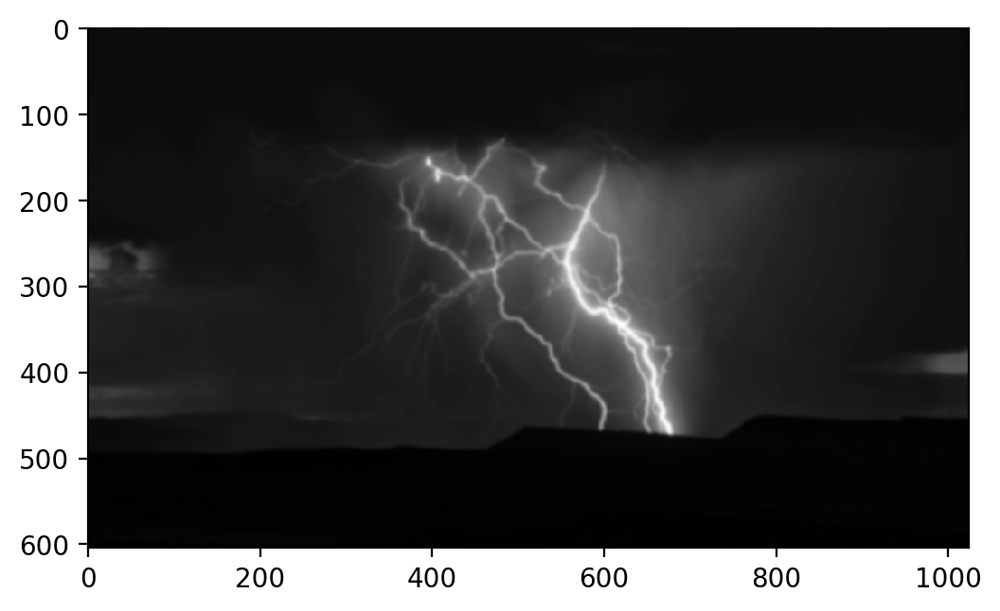

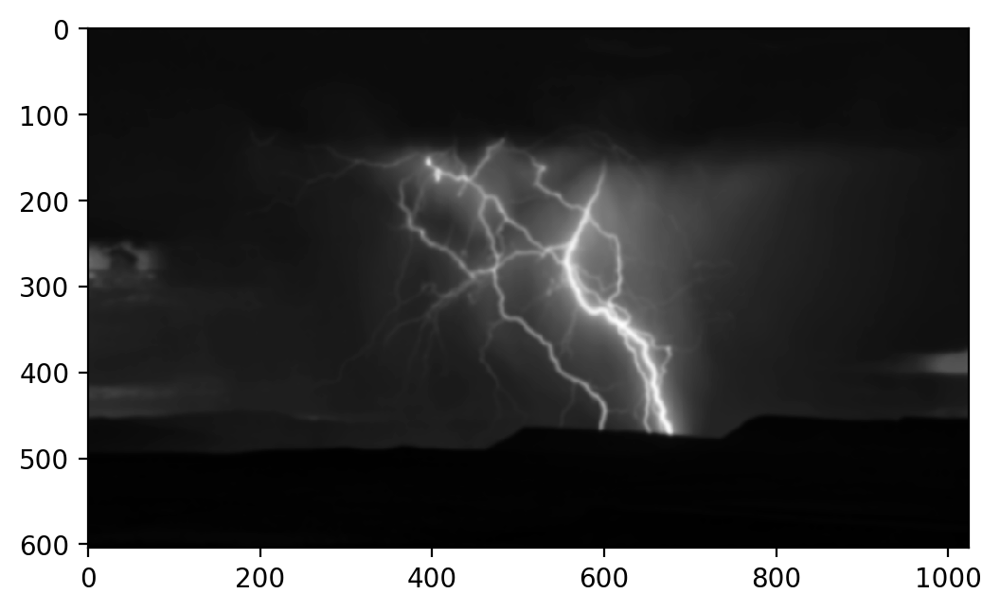

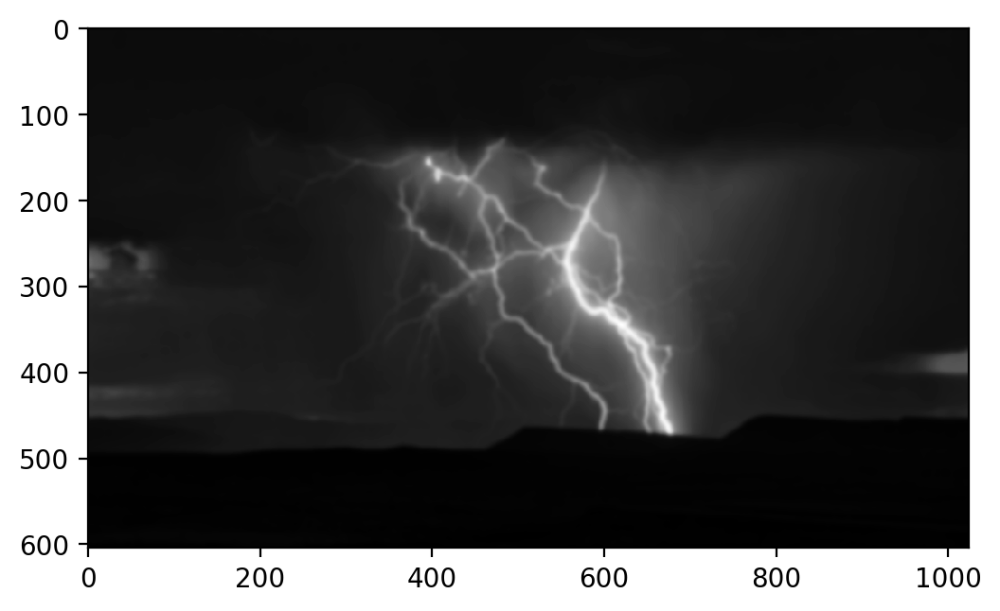

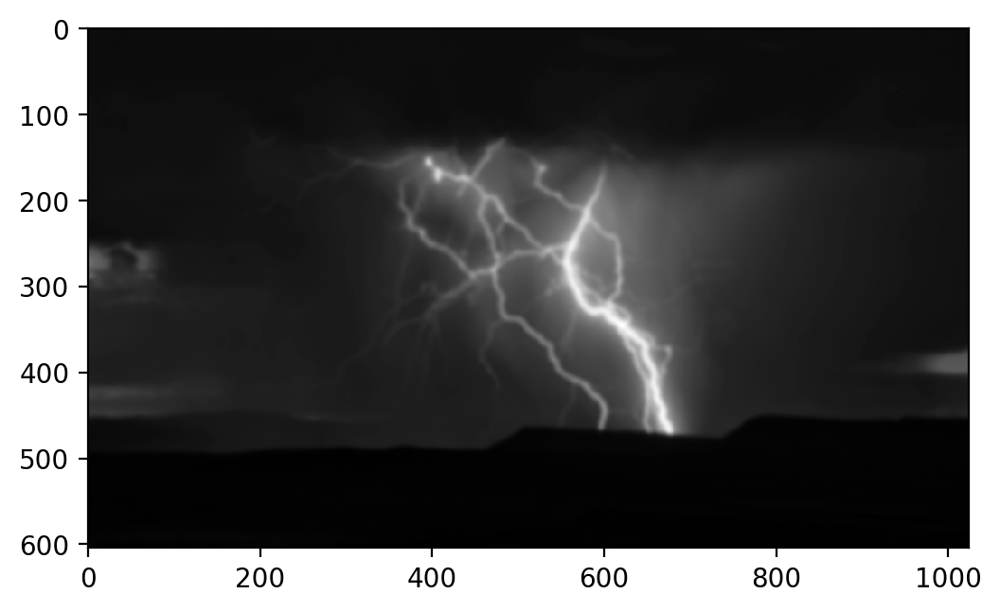

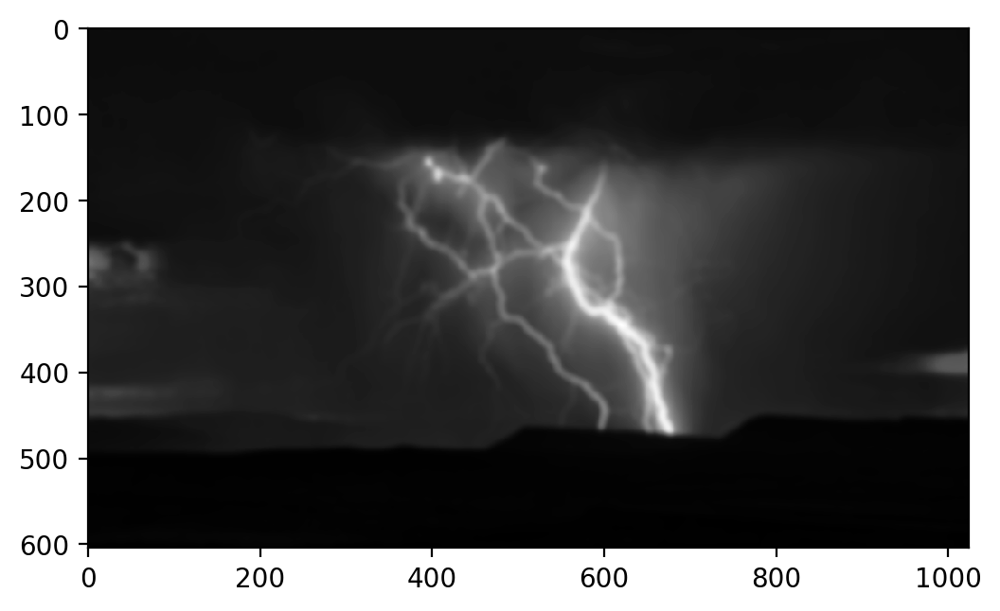

In [16]:
variance_images = []
for mean_image in mean_images:
    variance_images.append(np.power(image-mean_image,2))
    
for variance_image in variance_images:
    show_image(variance_image)

### Median Filter

/home/maljovec/anaconda3/envs/regulus/lib/python3.7/site-packages/skimage/util/dtype.py:130: UserWarning: Possible precision loss when converting from float64 to uint8
  .format(dtypeobj_in, dtypeobj_out))


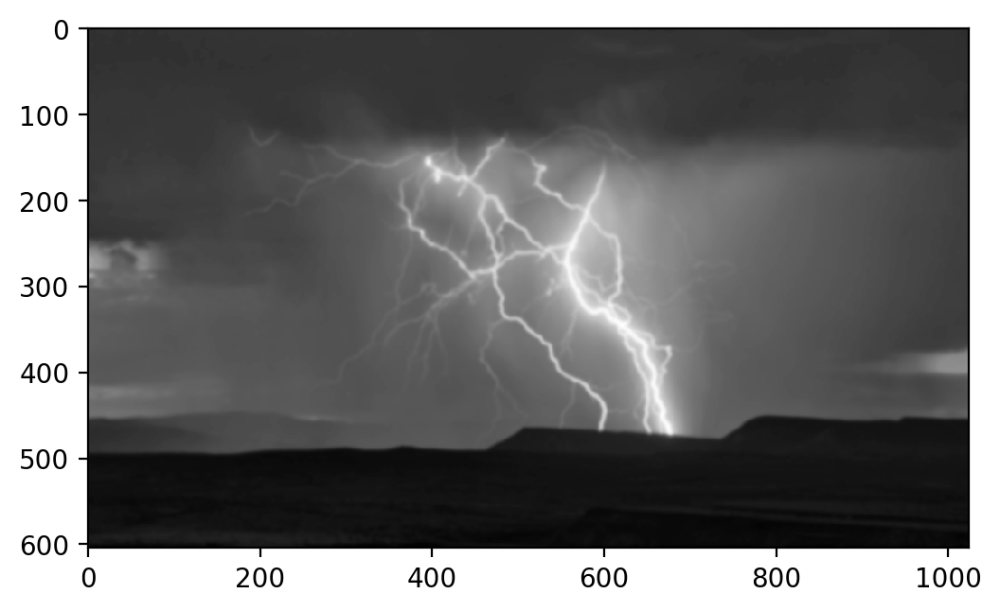

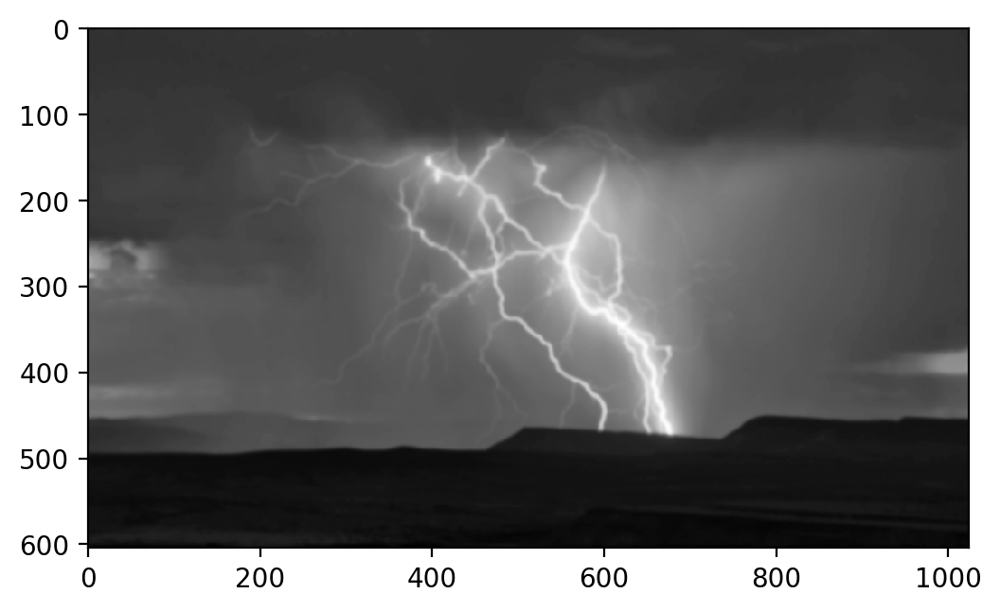

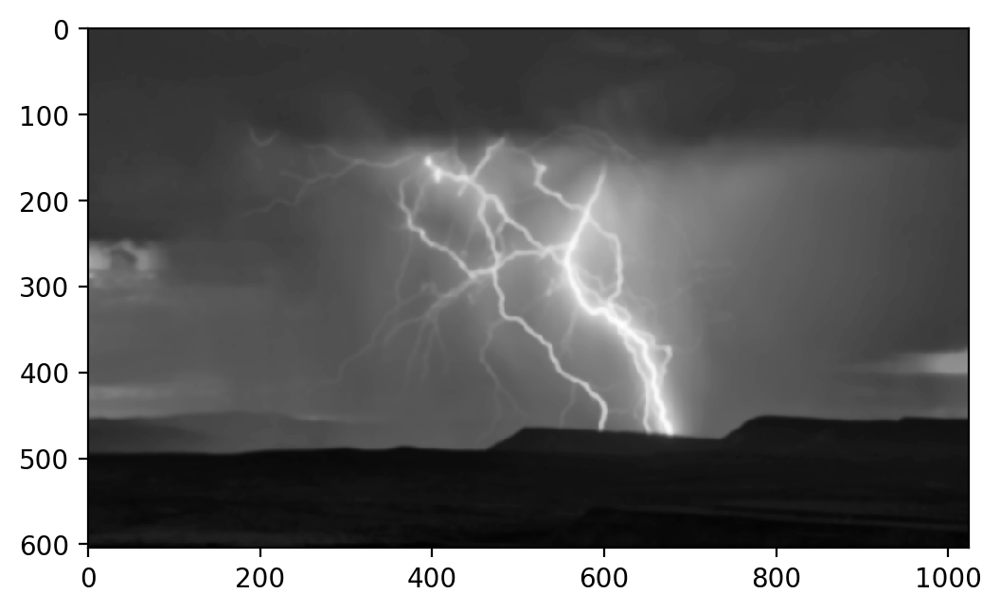

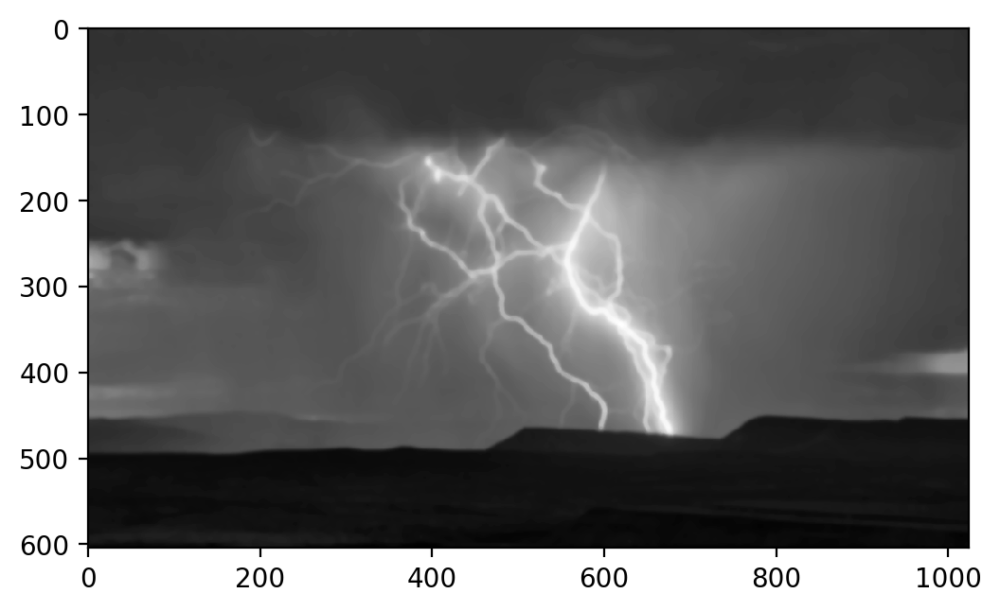

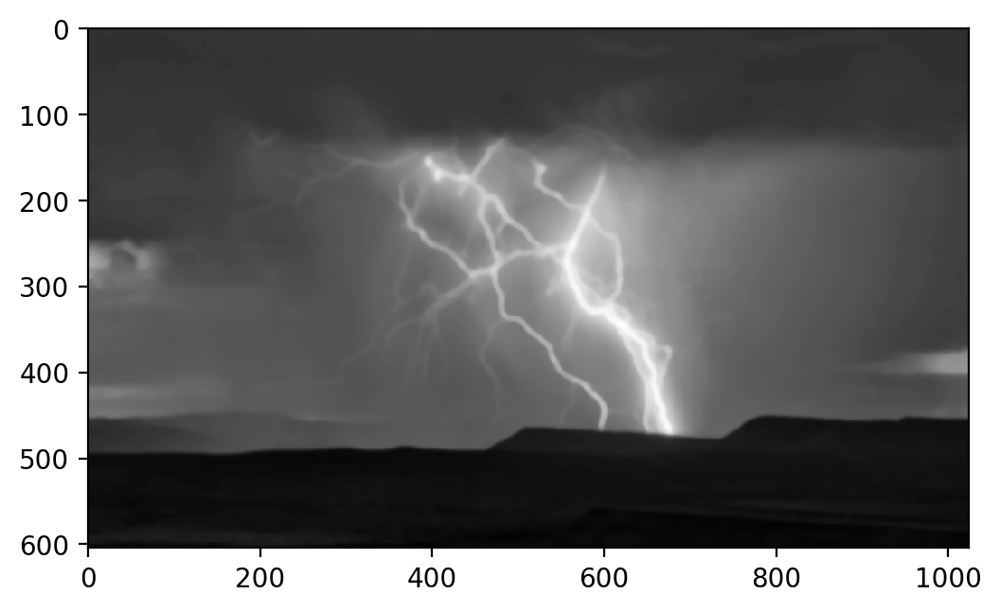

In [17]:
median_images = []
for i in range(1, max_radius):
    median_images.append(filters.rank.median(image, selem=morphology.disk(i)))

for median_image in median_images:
    show_image(median_image)

### Minimum Filter

/home/maljovec/anaconda3/envs/regulus/lib/python3.7/site-packages/skimage/util/dtype.py:130: UserWarning: Possible precision loss when converting from float64 to uint8
  .format(dtypeobj_in, dtypeobj_out))


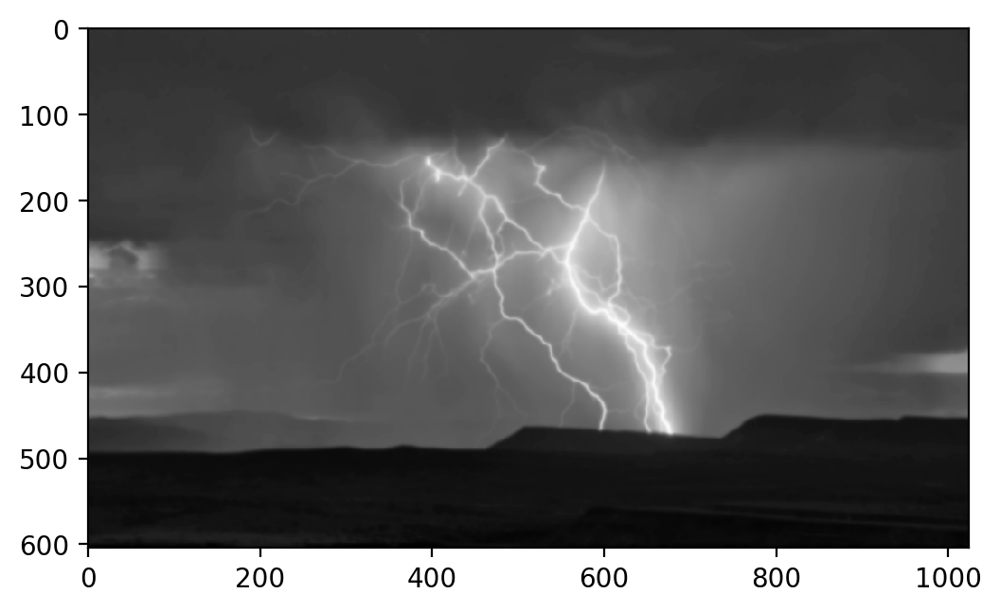

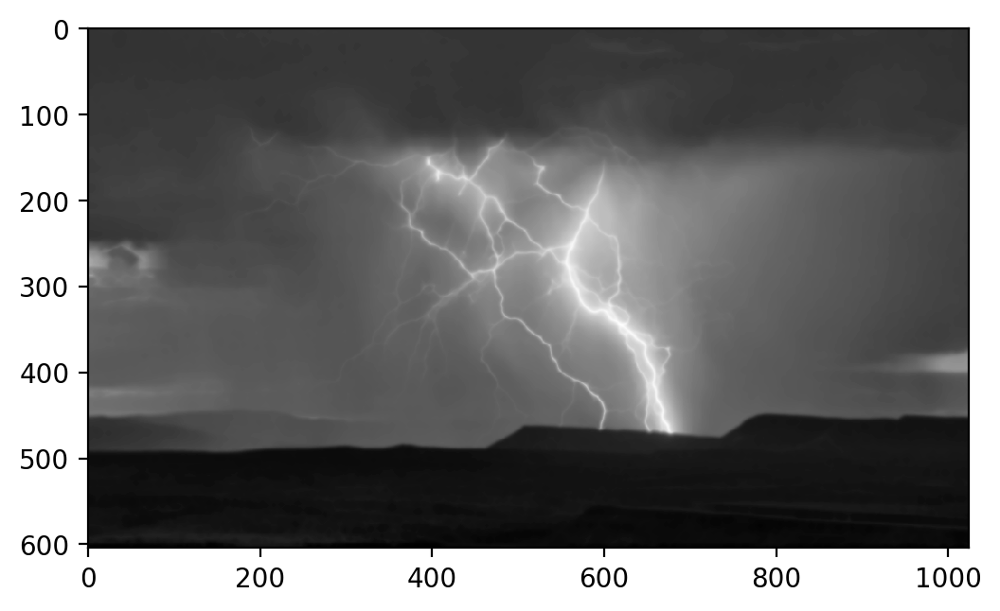

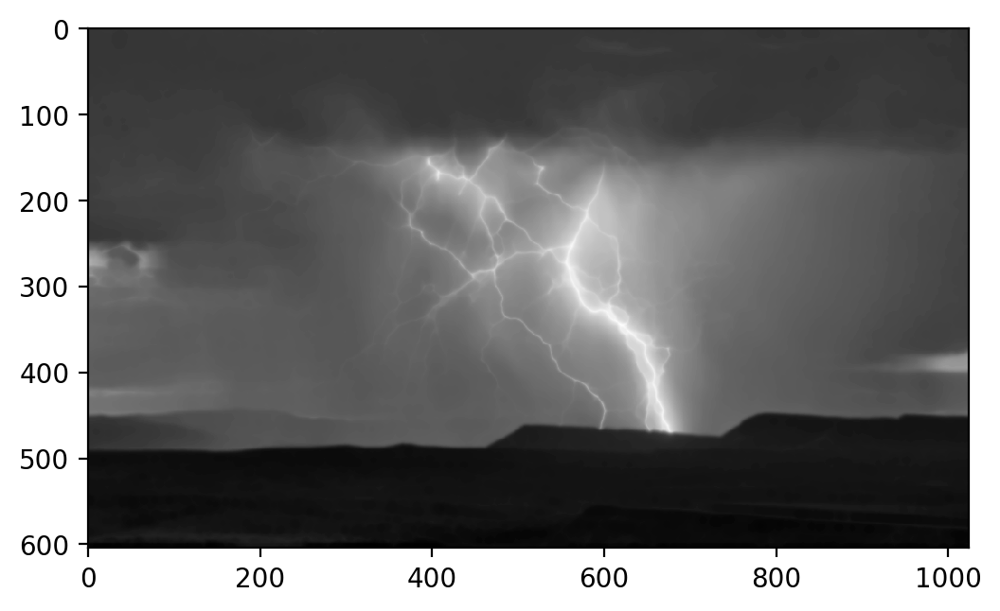

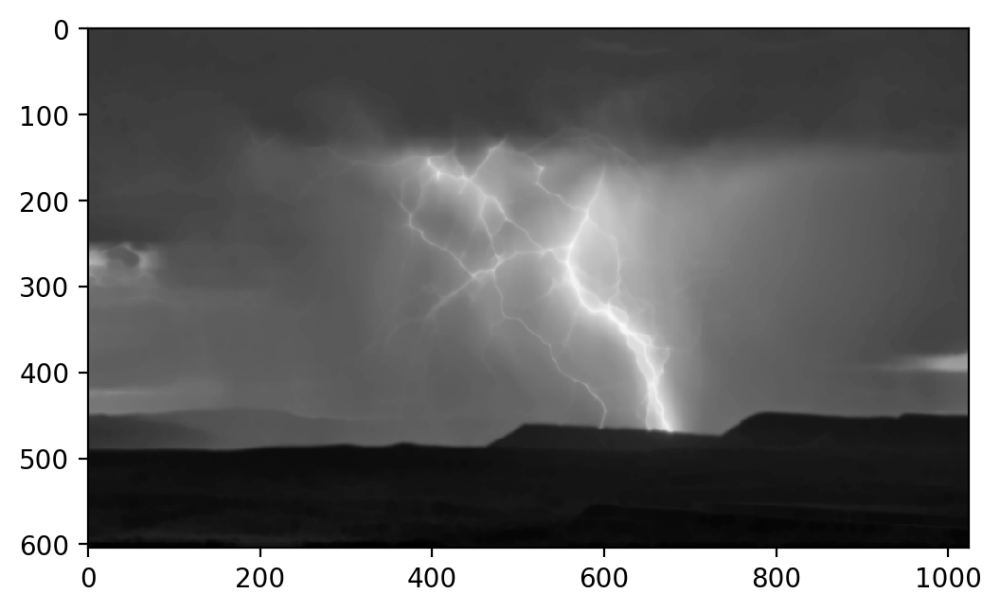

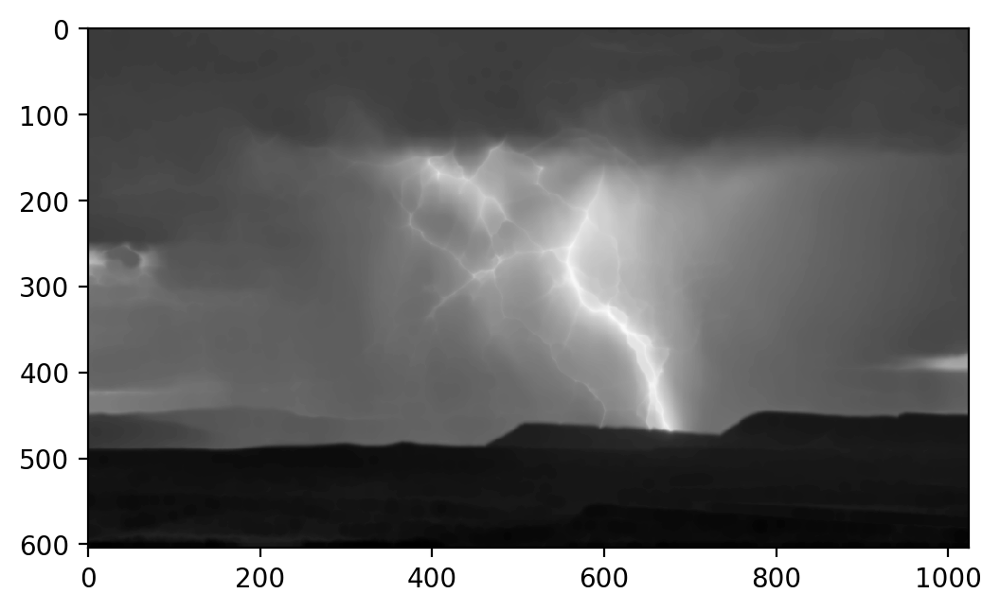

In [18]:
minimum_images = []
for i in range(1, max_radius):
    minimum_images.append(filters.rank.minimum(image, selem=morphology.disk(i)))

for minimum_image in minimum_images:
    show_image(minimum_image)

### Maximum Filter

/home/maljovec/anaconda3/envs/regulus/lib/python3.7/site-packages/skimage/util/dtype.py:130: UserWarning: Possible precision loss when converting from float64 to uint8
  .format(dtypeobj_in, dtypeobj_out))


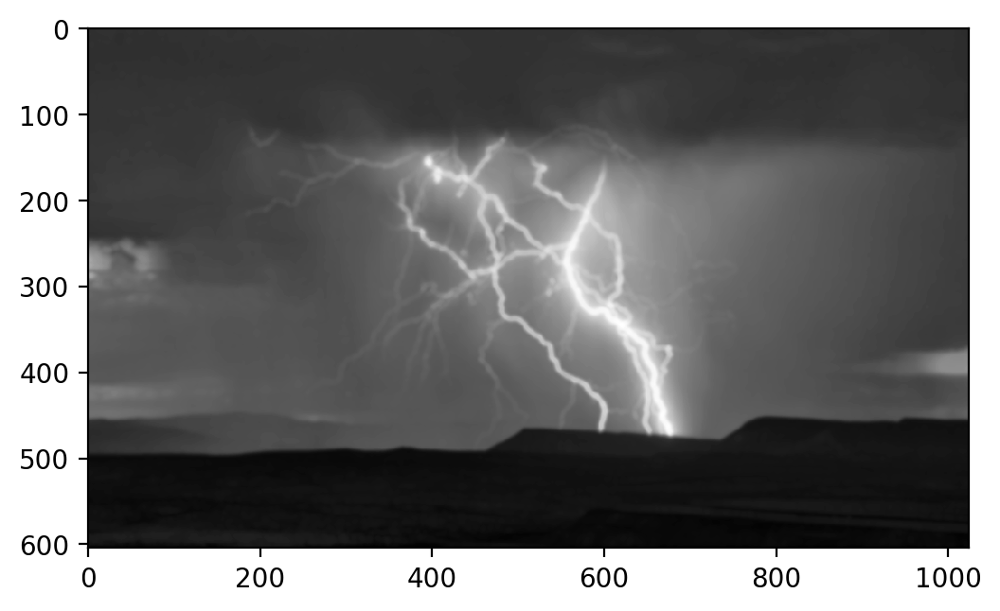

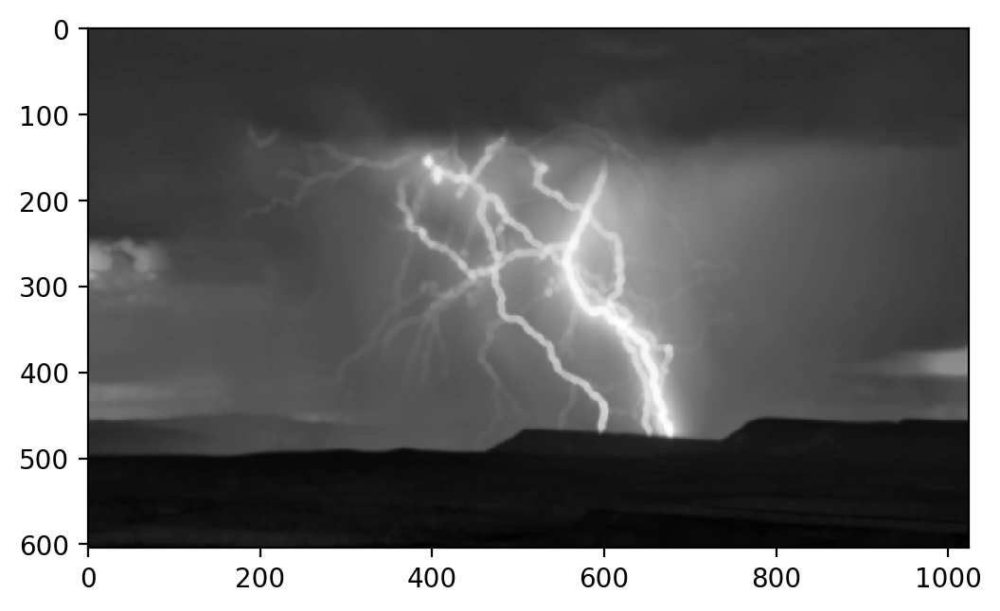

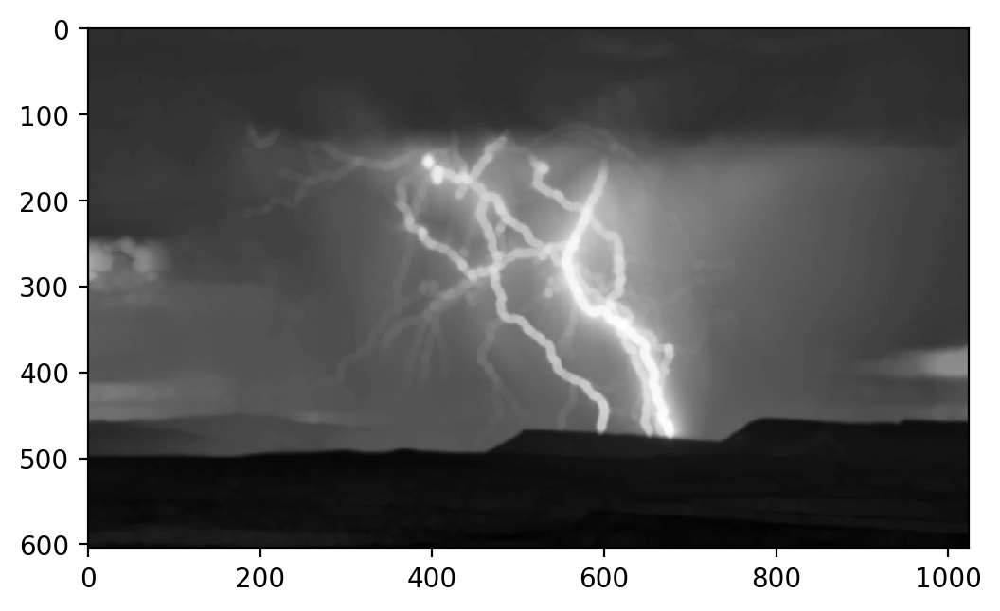

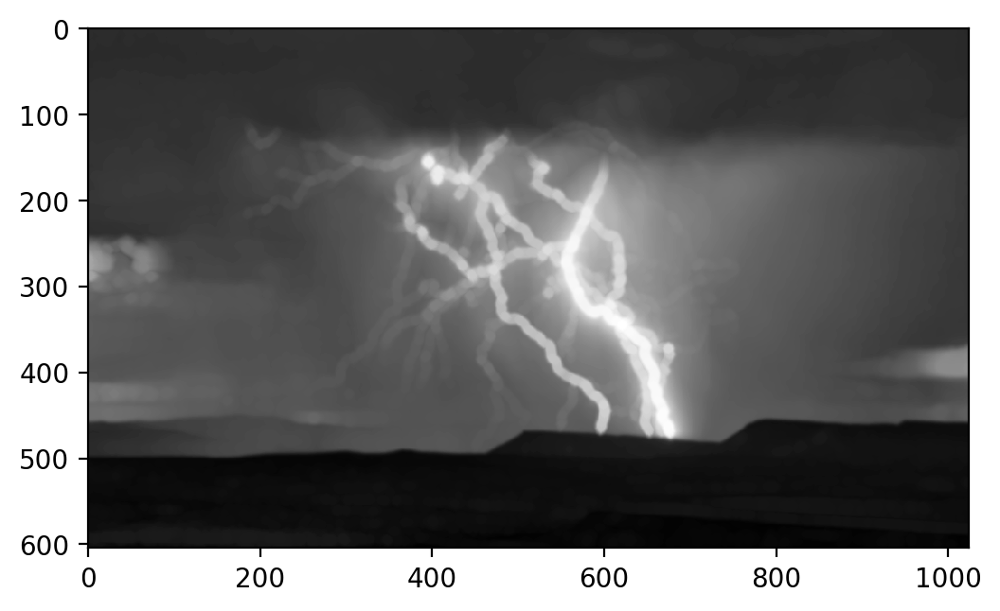

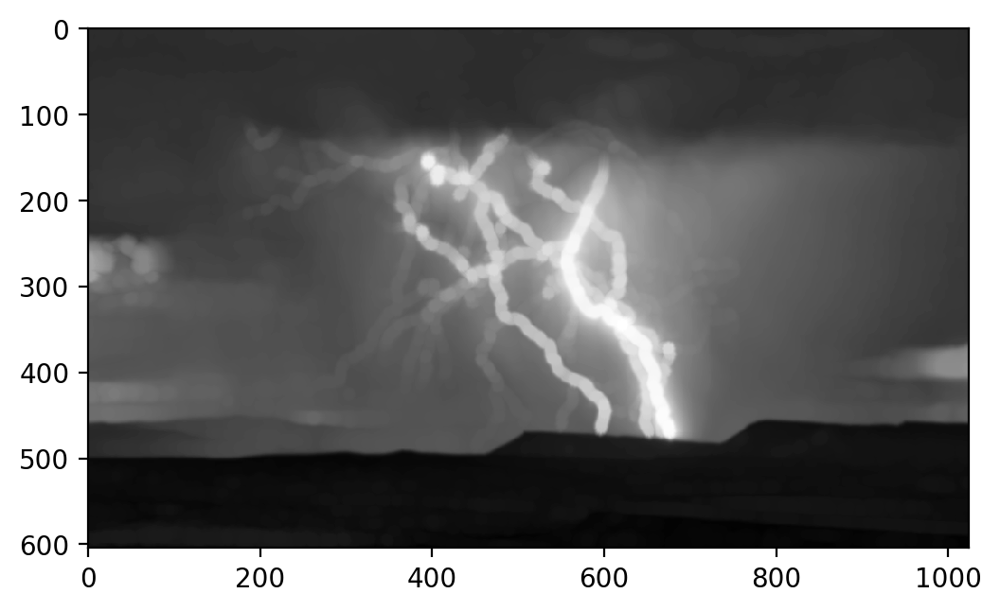

In [19]:
maximum_images = []
for i in range(1, max_radius):
    maximum_images.append(filters.rank.maximum(image, selem=morphology.disk(i)))

for maximum_image in maximum_images:
    show_image(maximum_image)

### Anisotropic Diffusion

In [20]:
# TODO

### Bilateral Filter

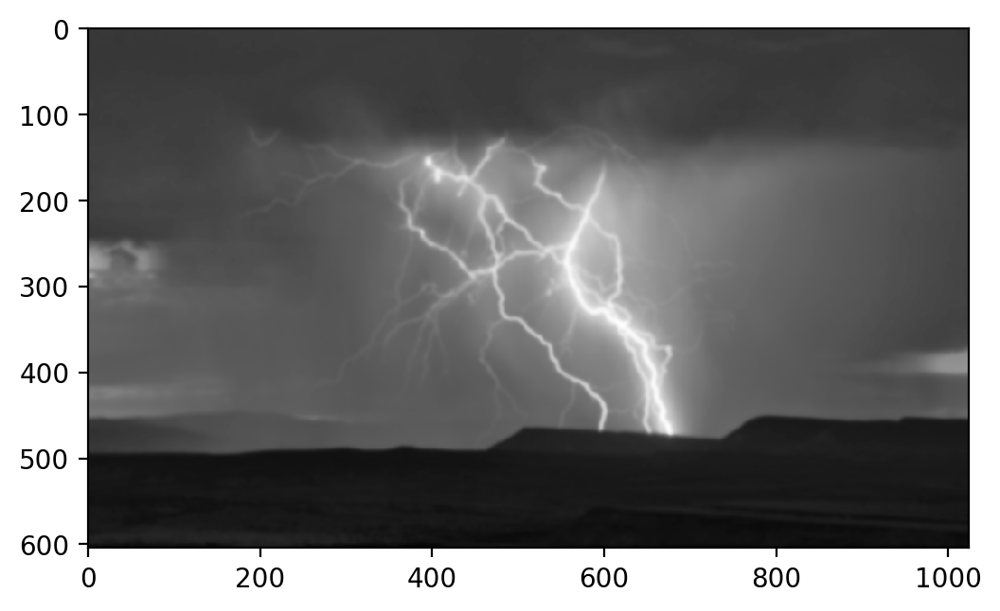

In [21]:
# TODO ensure parameters match the Weka specification (I'm just using the defaults for now)
bilateral_image = restoration.denoise_bilateral(image, win_size=None, sigma_color=None, sigma_spatial=1, bins=10000, mode='constant', cval=0, multichannel=False)
show_image(bilateral_image)

### Lipschitz Filter

In [22]:
# TODO


### Kuwahara Filter

In [23]:
# TODO


### Gabor Filter

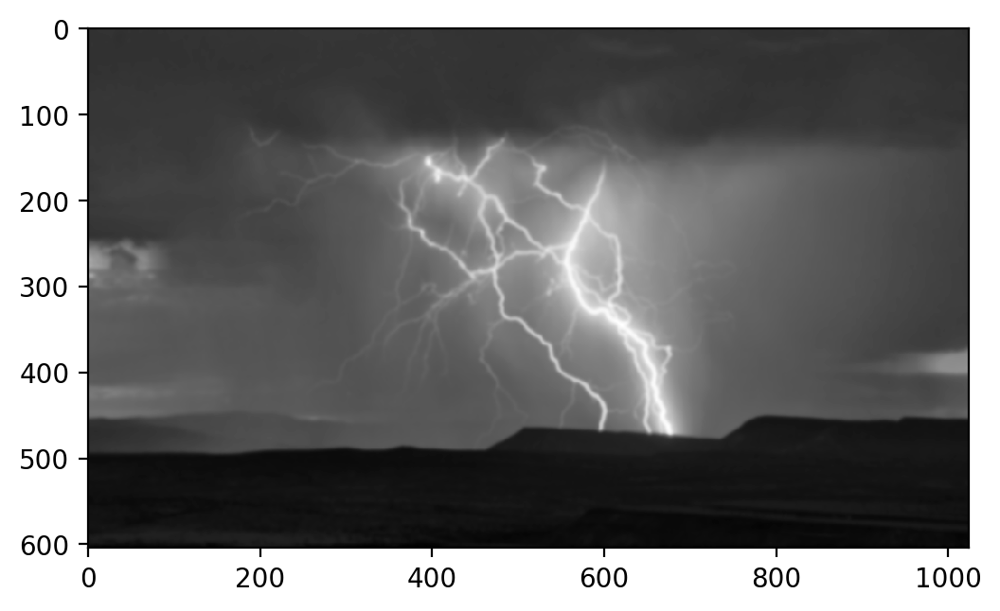

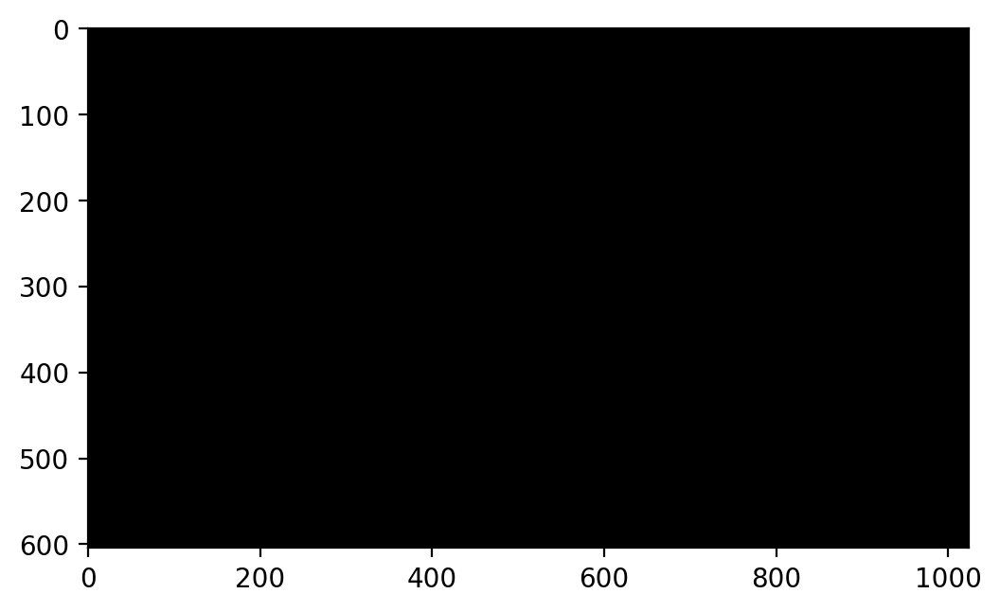

In [24]:
# TODO: learn more about this filter and what values to use for frequency.
gabor_real_image, gabor_imaginary_image = filters.gabor(image, frequency=3, theta=0, bandwidth=1, sigma_x=None, sigma_y=None, n_stds=3, offset=0, mode='reflect', cval=0)
show_image(gabor_real_image)
show_image(gabor_imaginary_image)

### Derivative Filters

In [25]:
# TODO

### Laplacian Filter

/home/maljovec/anaconda3/envs/regulus/lib/python3.7/site-packages/skimage/restoration/uft.py:447: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  impr[([slice(1, 2)] * ndim)] = 2.0 * ndim


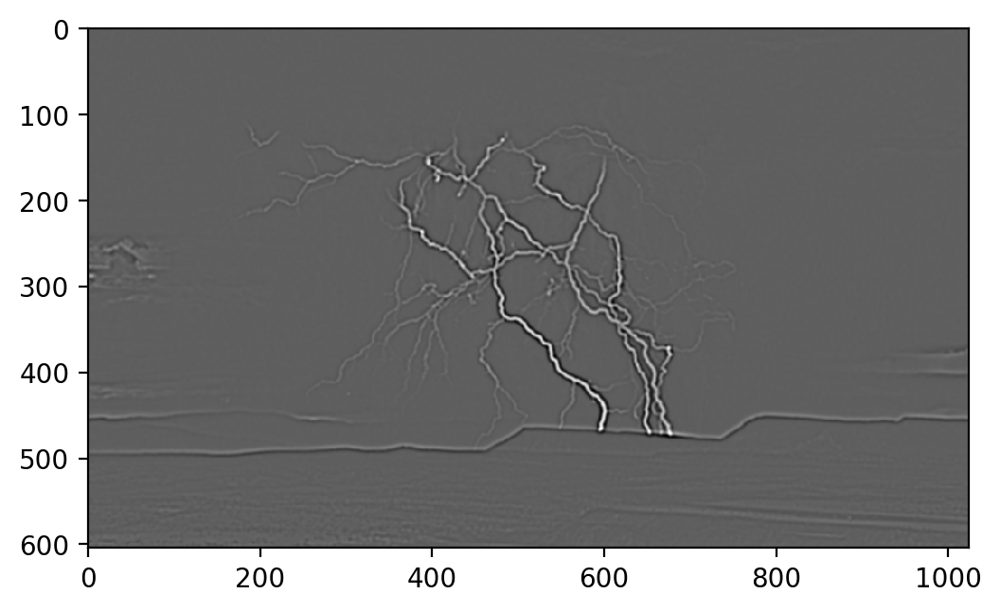

In [26]:
laplace_image = filters.laplace(image, ksize=3)
show_image(laplace_image)

### Structure Filter

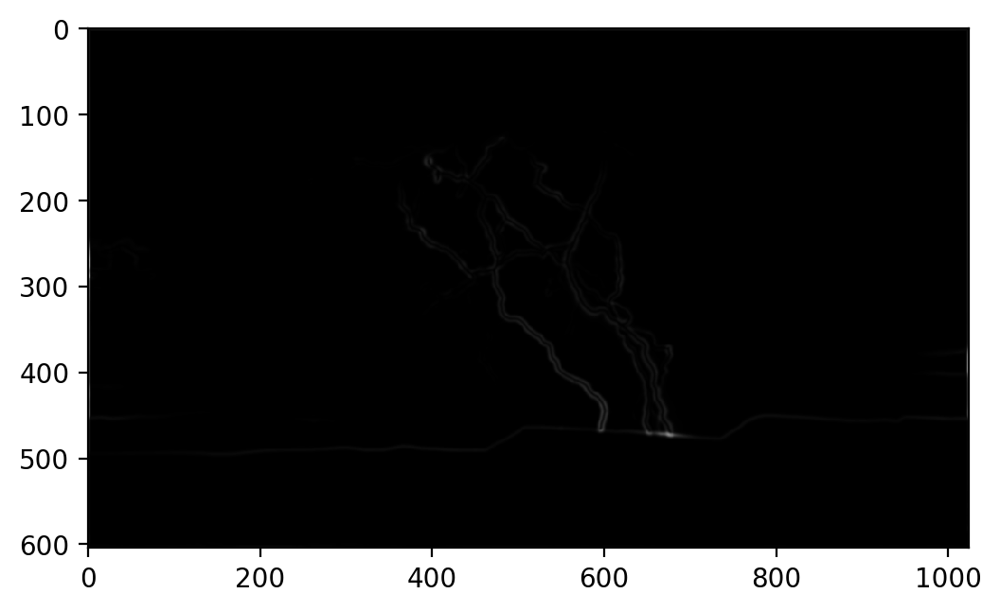

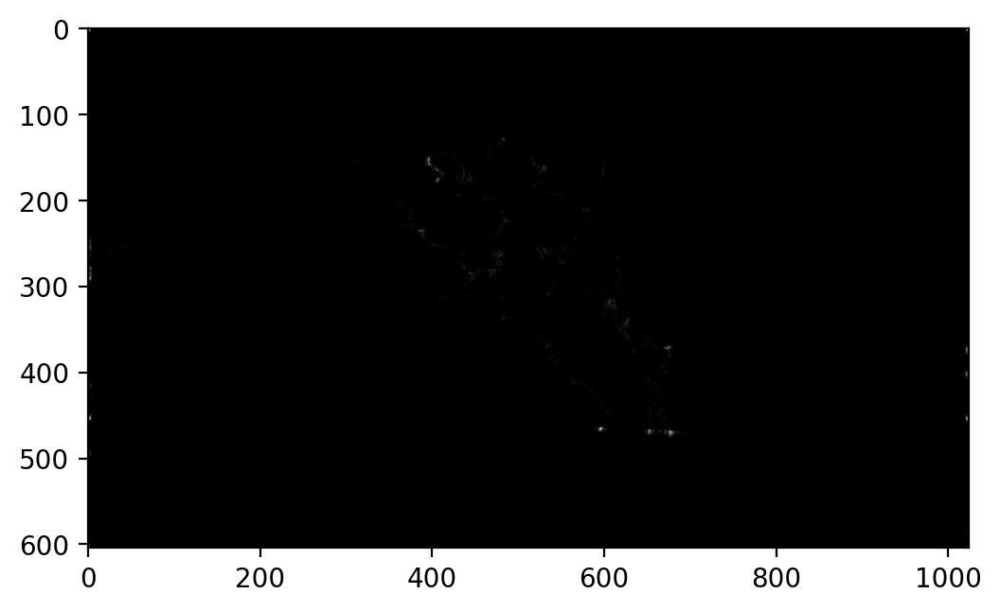

In [27]:
structure_tensor = feature.structure_tensor(image, sigma=1, mode='constant', cval=0)
largest_eig_image = np.zeros(shape=image.shape)
smallest_eig_image = np.zeros(shape=image.shape)
for row in range(structure_tensor[0].shape[0]):
    for col in range(structure_tensor[0].shape[1]):
        Axx = structure_tensor[0][row, col]
        Axy = structure_tensor[1][row, col]
        Ayy = structure_tensor[2][row, col]
        eigs = np.linalg.eigvals([[Axx, Axy], [Axy, Ayy]])
        largest_eig_image[row, col] = np.max(eigs)
        smallest_eig_image[row, col] = np.min(eigs)
        
show_image(largest_eig_image)
show_image(smallest_eig_image)

### Entropy Filter

/home/maljovec/anaconda3/envs/regulus/lib/python3.7/site-packages/skimage/util/dtype.py:130: UserWarning: Possible precision loss when converting from float64 to uint8
  .format(dtypeobj_in, dtypeobj_out))


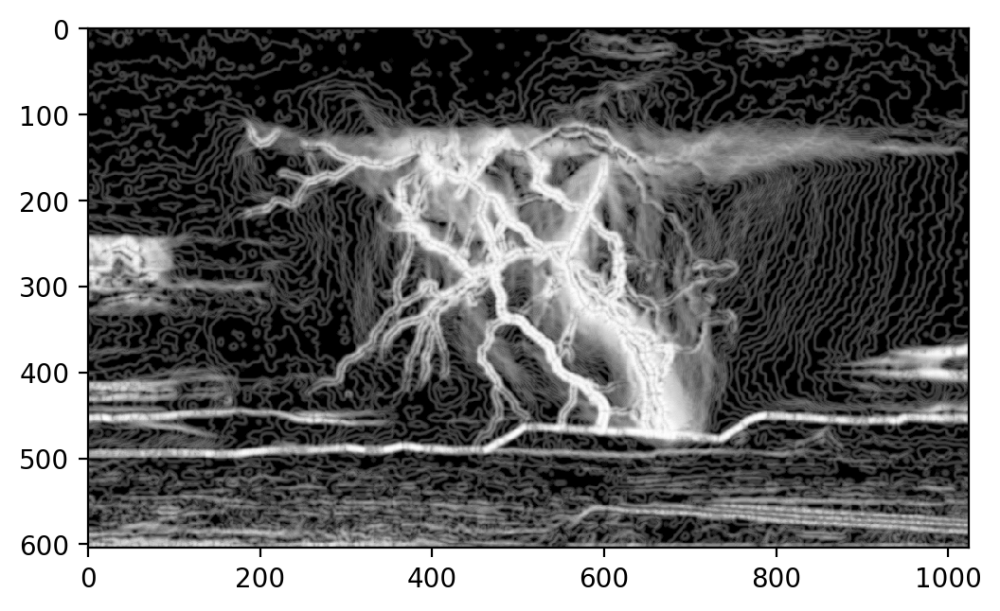

In [28]:
entropy_image = filters.rank.entropy(image, selem=morphology.disk(3))
show_image(entropy_image)

### Neighbors

In [29]:
neighbor_images = []
directions = [(-1,-1), (-1, 0), (-1, 1), (0, -1), (0, 1), (1, -1), (1, 0), (1, 1)]
sigma = 1

for t in directions:
    for sigma in range(1, max_shift):
        tform = transform.SimilarityTransform(scale=1, rotation=0, translation=tuple([sigma*val for val in t]))
        neighbor_images.append(transform.warp(image, tform))
        
for neighbor_image in neighbor_images:
    show_image(neighbor_image)

# Loading the Morse-Smale Complex

In [30]:
proc = subprocess.Popen([os.path.join('..','MSCvisus','MSCTest2DViewer','test_2d_viewer'),
                                fname_raw,
                                str(image.shape[1]),
                                str(image.shape[0]),
                                "1",
                                "1",
                                str(persistence_coarse)],
                               stdin=subprocess.PIPE,
                               stdout=subprocess.PIPE,
                               stderr=subprocess.PIPE)
stdout, stderr = proc.communicate()
print(stdout.decode("utf-8"))
print(stderr.decode("utf-8"))
test_msc_coarse = MSC()
test_msc_coarse.read_from_file(fname_raw)
print('Arc count for p={}: {}'.format(persistence_coarse, len(test_msc_coarse.arcs)))

proc = subprocess.Popen([os.path.join('..','MSCvisus','MSCTest2DViewer','test_2d_viewer'),
                                fname_raw,
                                str(image.shape[1]),
                                str(image.shape[0]),
                                "1",
                                "1",
                                str(persistence_fine)],
                               stdin=subprocess.PIPE,
                               stdout=subprocess.PIPE,
                               stderr=subprocess.PIPE)
stdout, stderr = proc.communicate()
print(stdout.decode("utf-8"))
print(stderr.decode("utf-8"))
test_msc_fine = MSC()
test_msc_fine.read_from_file(fname_raw)
print('Arc count for p={}: {}'.format(persistence_fine, len(test_msc_fine.arcs)))

0=../MSCvisus/MSCTest2DViewer/test_2d_viewer
1=img/lightning_smoothed.raw
2=1024
3=604
4=1
5=1
6=10
stest=618496
Computing discrete gradient: 
Gothere
neighbor=2048
maxval = 0.274356, looky = 0.027436, num = 2162
pos is 2098
writing nodes
writing arcs


Arc count for p=10: 251
0=../MSCvisus/MSCTest2DViewer/test_2d_viewer
1=img/lightning_smoothed.raw
2=1024
3=604
4=1
5=1
6=0.5
stest=618496
Computing discrete gradient: 
Gothere
neighbor=2048
maxval = 0.274356, looky = 0.001372, num = 2162
pos is 1233
writing nodes
writing arcs


Arc count for p=0.5: 3618


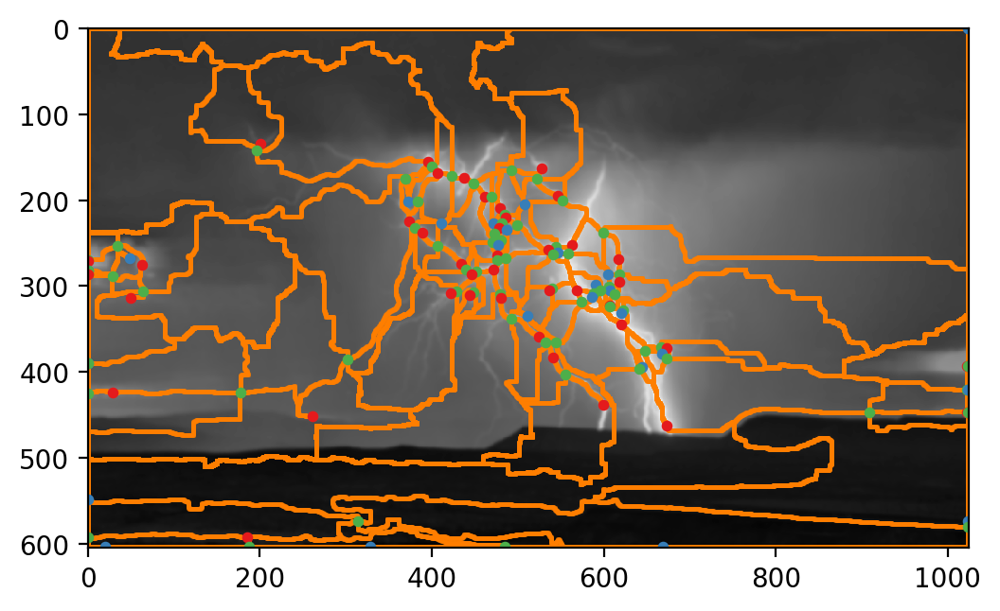

In [31]:
show_image(image)

for a in test_msc_coarse.arcs:
    points = np.array(a.line)
    plt.scatter(points[:, 0], points[:, 1], color=orange, s=1, marker=',', alpha=0.5)

colors = [blue, green, red]
for node in test_msc_coarse.nodes.values():
    x, y = node.xy
    plt.scatter(x, y, color=colors[node.index], s=10)

plt.gca().set_xlim(0, image.shape[1])
_ = plt.gca().set_ylim(image.shape[0], 0)

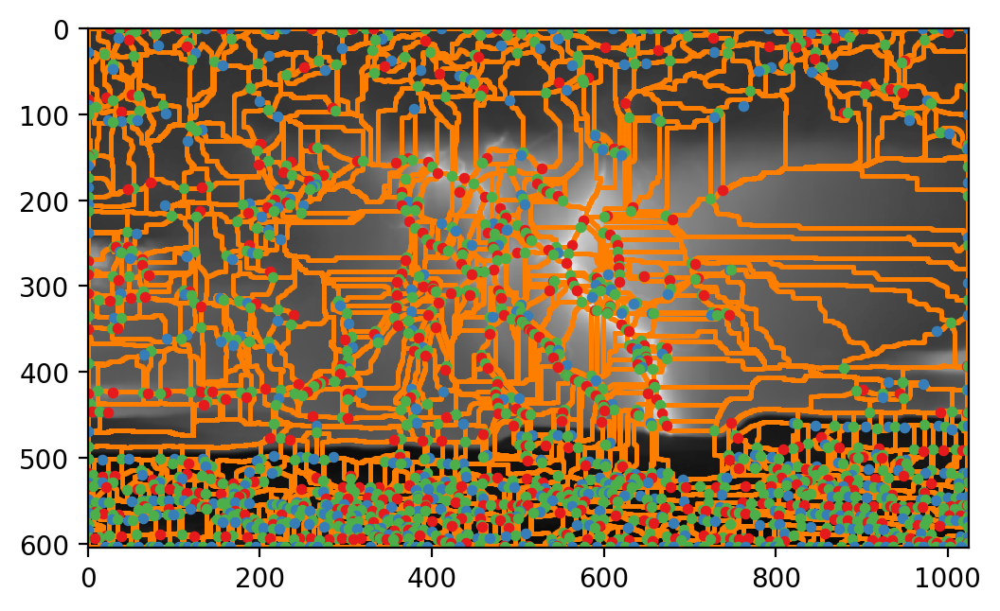

In [32]:
show_image(image)

for a in test_msc_fine.arcs:
    points = np.array(a.line)
    plt.scatter(points[:, 0], points[:, 1], color=orange, s=1, marker=',', alpha=0.5)

colors = [blue, green, red]
for node in test_msc_fine.nodes.values():
    x, y = node.xy
    plt.scatter(x, y, color=colors[node.index], s=10)

plt.gca().set_xlim(0, image.shape[1])
_ = plt.gca().set_ylim(image.shape[0], 0)

# Arc-Specific Feature Generation

We discussed adding features specific to the pixels intersecting the arcs. Such as the maximum pixel value on an arc, minimum pixel value on an arc, etc.

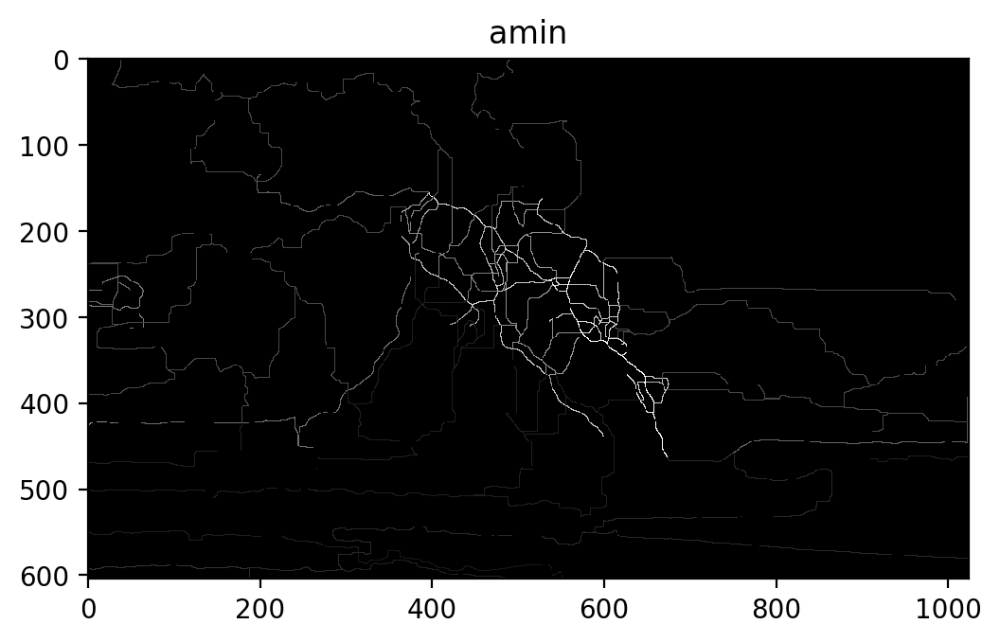

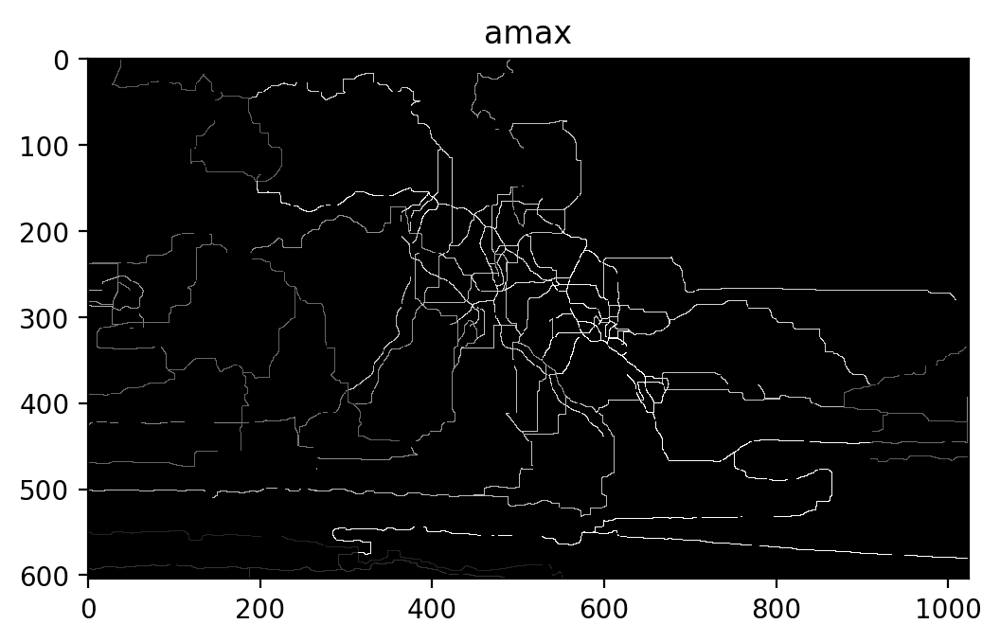

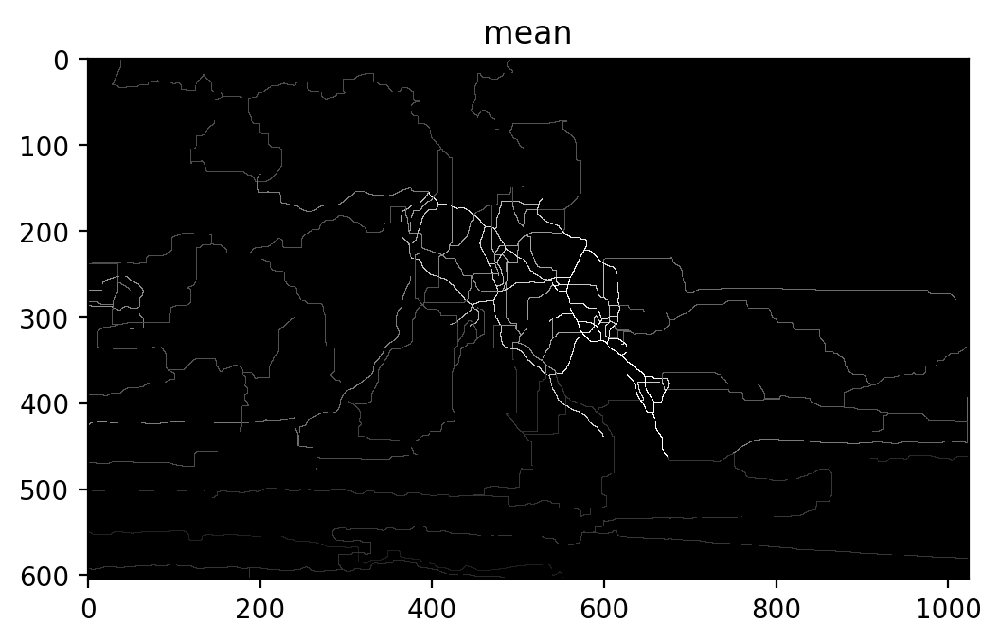

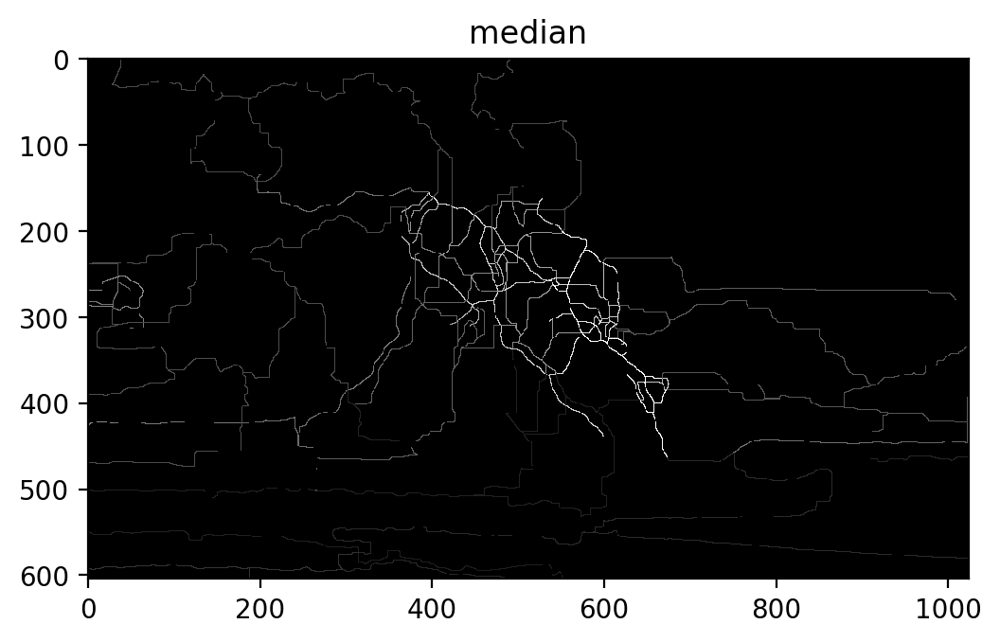

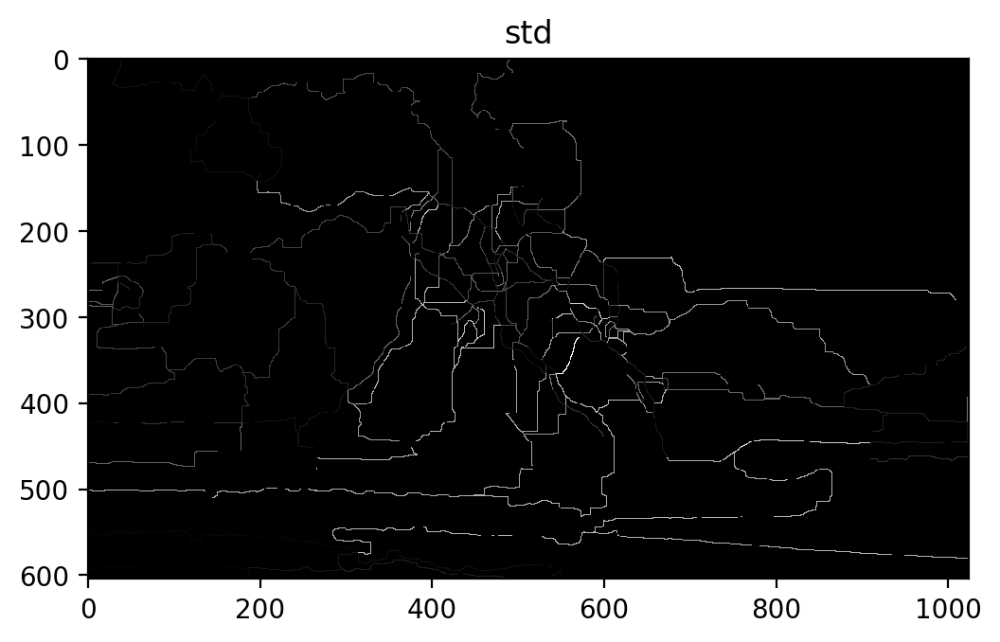

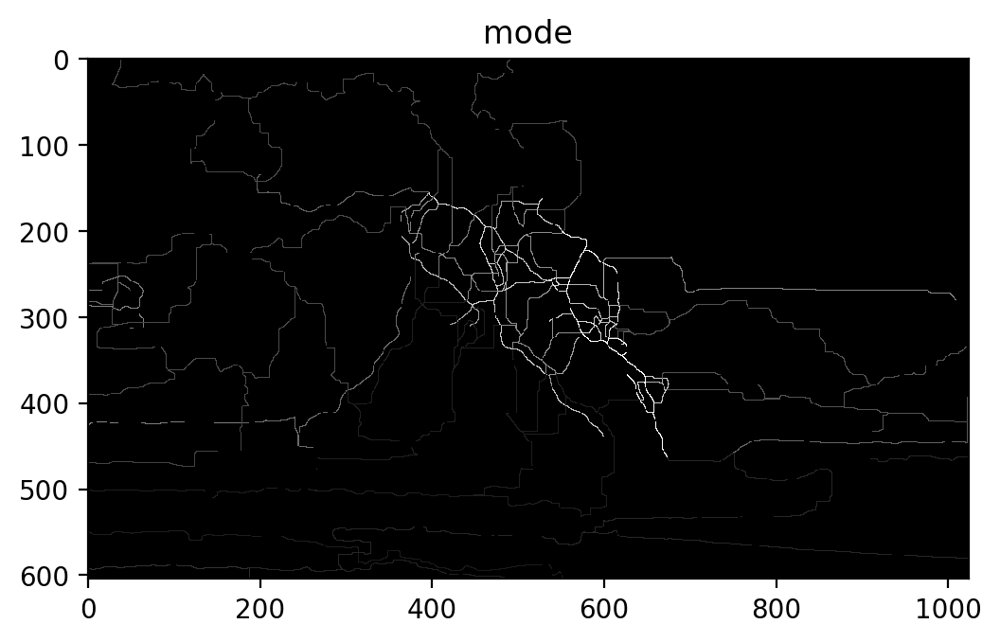

In [33]:
arc_images = {}

def mode(x):
    return stats.mode(x)[0][0]

aggregators = [np.min, np.max, np.mean, np.median, np.std, mode]

for foo in aggregators:
    arc_images[foo.__name__] = np.zeros(image.shape)

for a in test_msc_coarse.arcs:
    indices = np.flip(np.array(a.line, dtype=int), axis=1)
    values = [image[row, col] for row, col in indices]
    for foo in aggregators:
        value = foo(values)
        for row, col in indices:
            arc_images[foo.__name__][row, col] = value

for title, arc_image in arc_images.items():
    show_image(arc_image)
    plt.gca().set_title(title)

# Selecting Training Data

## Hand-Picked Ground Truth Labels

In [ ]:
in_samples = np.array([[556, 268],
                       [556, 269],
                       [556, 270],
                       [556, 271],
                       [556, 272],
                       [556, 273],
                       [556, 274],
                       [556, 275],
                       [557, 275],
                       [558, 276],
                       [558, 277],
                       [558, 278],
                       [556, 279]])

out_samples = np.array([[586, 237],
                        [586, 238],
                        [586, 239],
                        [586, 240],
                        [586, 241],
                        [586, 242],
                        [586, 243],
                        [586, 244],
                        [587, 245],
                        [588, 246],
                        [588, 247],
                        [588, 248],
                        [586, 249],
                        [586, 250]])

Note, below that the order of the indices (x=col, y=row). This is important and will need to be ensured that we do the same when we construct our training data.

In [ ]:
show_training_samples(image, in_samples, out_samples)

## Interactive Selection off of Image

### Fat Mask for Determining Feature vs. Non-Feature Selection

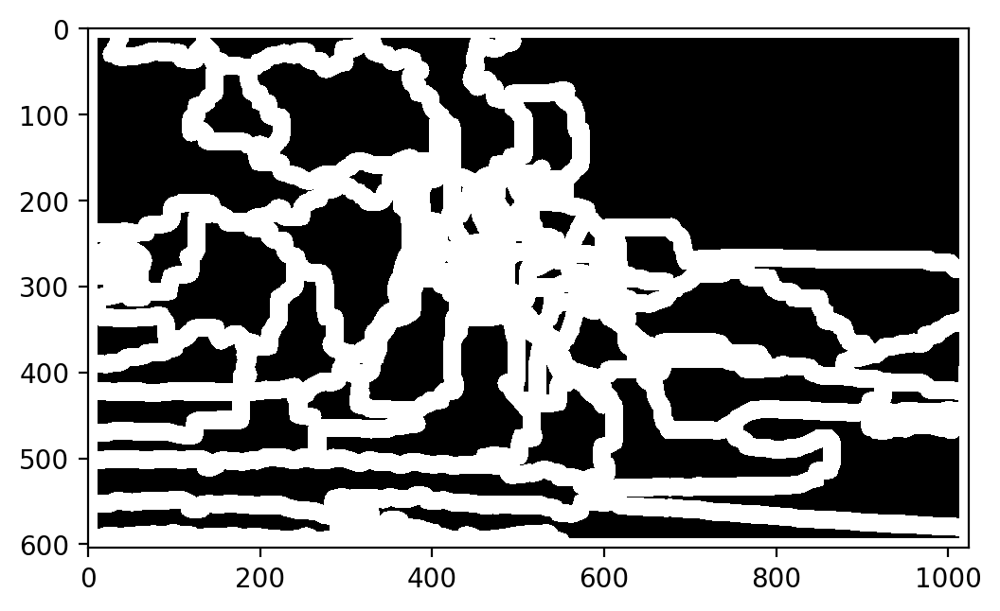

In [34]:
mask_image = np.zeros(image.shape)
for a in test_msc_coarse.arcs:
    points = np.array(a.line)
    for point in points:
        mask_image[int(point[1]), int(point[0])] = 1
        
mask_image = morphology.dilation(mask_image, selem=morphology.disk(10))
show_image(mask_image)

### Interactive Selection

<IPython.core.display.Javascript object>


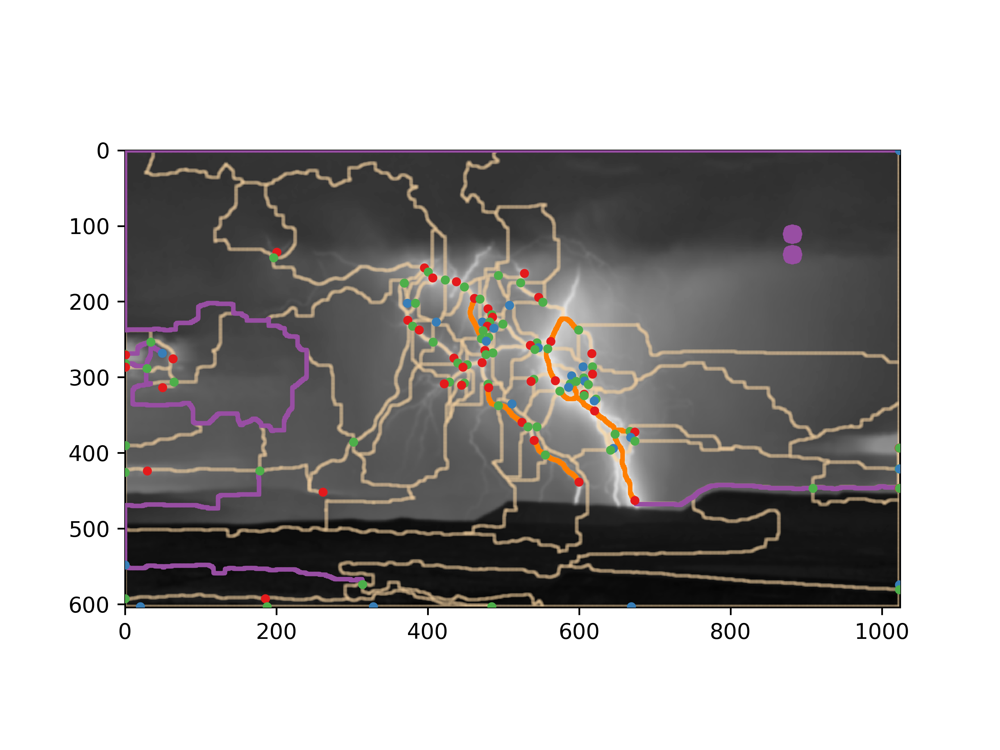

In [36]:
%matplotlib notebook

plt.ion()
fig = plt.figure(num=None, dpi=150)
plt.imshow(image, cmap=plt.cm.Greys_r, zorder=1)

selected_color = orange
inactive_color = light_orange
background_color = purple

selected_arcs = {}
background_arcs = {}
arc_pixels = set()
for a in test_msc_coarse.arcs:
    arc_index = tuple(a.node_ids)
    points = np.array(a.line)
    for pt in points:
        arc_pixels.add((int(pt[0]), int(pt[1])))
    selected_arcs[arc_index] = plt.scatter(points[:, 0], points[:, 1], color=selected_color, s=1, marker=',', zorder=3)
    background_arcs[arc_index] = plt.scatter(points[:, 0], points[:, 1], color=background_color, s=1, marker=',', zorder=3)
    selected_arcs[arc_index].set_visible(False)
    background_arcs[arc_index].set_visible(False)

arc_pixels = np.array(list(arc_pixels), dtype=int)
plt.scatter(arc_pixels[:, 0], arc_pixels[:, 1], color=inactive_color, s=1, marker=',', zorder=2, alpha=0.1)
    
colors = [blue, green, red]
for node in test_msc_coarse.nodes.values():
    x, y = node.xy
    plt.scatter(x, y, color=colors[node.index], s=10, zorder=4)

plt.gca().set_xlim(0, image.shape[1])
plt.gca().set_ylim(image.shape[0], 0)

selected_indices = set()
background_indices = set()
background_pixels = set()

radius = 10
shape = morphology.disk(radius)

stored_event = None

def toggle_arc(x, y, in_class=True):
    min_distance = None
    min_index = None
    pt = np.array([x, y])
    for a in test_msc_coarse.arcs:
        points = np.array(a.line)
        distance = np.min(np.linalg.norm(np.array(a.line) - pt, axis=1))
        if min_distance is None or distance < min_distance:
            min_distance = distance
            min_index = tuple(a.node_ids)
    if in_class:
        if min_index in selected_indices:
            selected_indices.remove(min_index)
        else:
            selected_indices.add(min_index)
            if min_index in background_indices:
                background_indices.remove(min_index)
    else:
        if min_index in background_indices:
            background_indices.remove(min_index)
        else:
            background_indices.add(min_index)
            if min_index in selected_indices:
                selected_indices.remove(min_index)
    return min_index

def highlight_background(x, y):
    start_y = y - radius
    start_x = x - radius
    for i in range(0, 2*radius+1):
        xi = start_x + i
        if xi > 0 and xi < mask_image.shape[1]:
            for j in range(0, 2*radius+1):
                yj = start_y + j
                if yj > 0 and yj < mask_image.shape[0]:
                    if shape[j, i] and not mask_image[yj, xi]:
                        background_pixels.add((xi, yj))

def onclick(event):
    stored_event = event
    if mask_image[int(event.ydata), int(event.xdata)]:
        selected_index = toggle_arc(event.xdata, event.ydata, event.button == 1)
        if event.button == 1:
            selected_arcs[selected_index].set_visible(not selected_arcs[selected_index].get_visible())
        else:
            background_arcs[selected_index].set_visible(not background_arcs[selected_index].get_visible())
    else:
        highlight_background(int(event.xdata), int(event.ydata))
    
    for (x, y) in background_pixels:
        plt.scatter(x, y, color=background_color, s=1, marker=',', zorder=4)
        
    fig.canvas.draw()

cid = fig.canvas.mpl_connect('button_press_event', onclick)

In [37]:
# Reset to static graphic rendering
%matplotlib inline

in_samples = tuple()
out_samples = tuple()
for arc in test_msc_coarse.arcs:
    index = tuple(arc.node_ids)
    if index in selected_indices:
        points = np.array(arc.line)
        in_samples += tuple(points, )
    elif index in background_indices:
        points = np.array(arc.line)
        out_samples += tuple(points, )

in_samples = np.vstack(in_samples)

out_samples += tuple(np.array(list(background_pixels)), )
out_samples = np.vstack(out_samples)

in_samples = np.array(in_samples, dtype=int)
out_samples = np.array(out_samples, dtype=int)

# Build Models

## Massage the Input

In [38]:
# First grab all of the single image variables
growing_tuple = (image,
                 sobel_image,
                 hessian_image,
                 bilateral_image,
                 gabor_real_image,
                 laplace_image,
                 largest_eig_image,
                 smallest_eig_image,
                 entropy_image)

# Then add all of the multiple image variables
growing_tuple += tuple(diff_images)
growing_tuple += tuple(mean_images)
growing_tuple += tuple(variance_images)
growing_tuple += tuple(median_images)
growing_tuple += tuple(minimum_images)
growing_tuple += tuple(maximum_images)
growing_tuple += tuple(neighbor_images)
growing_tuple += tuple(membrane_projection_images)
growing_tuple += tuple(arc_images.values())

compiled_data = np.dstack(growing_tuple)
print(compiled_data.shape)

(604, 1024, 56)


In [39]:
# Note the use of the backwards indexing here,
# the y values of "samples" variables are actually the rows of the images
in_class = compiled_data[in_samples[:, 1], in_samples[:, 0], :]
out_class = compiled_data[out_samples[:, 1], out_samples[:, 0], :]
train_x = np.vstack((in_class, out_class))
train_y = np.hstack((np.ones(in_class.shape[0]), np.zeros(out_class.shape[0])))
classifiers = {}

## Build a Random Forest

In [40]:
classifiers['random_forest'] = ensemble.RandomForestClassifier(n_estimators=10,
                                                               criterion='gini',
                                                               max_depth=None,
                                                               min_samples_split=2,
                                                               min_samples_leaf=1,
                                                               min_weight_fraction_leaf=0.0,
                                                               max_features='auto',
                                                               max_leaf_nodes=None,
                                                               min_impurity_decrease=0.0,
                                                               min_impurity_split=None,
                                                               bootstrap=True,
                                                               oob_score=False,
                                                               n_jobs=1,
                                                               random_state=None,
                                                               verbose=0,
                                                               warm_start=False,
                                                               class_weight=None)

classifiers['random_forest'].fit(train_x, train_y)
classifiers['random_forest'].score(train_x, train_y)

0.9998864668483197

## Build an SVM

In [41]:
svc = svm.SVC(C=1.0,
              kernel='rbf',
              gamma='auto',
              coef0=0.0,
              shrinking=True,
              probability=False,
              tol=0.001,
              cache_size=2048,
              class_weight=None,
              verbose=False,
              max_iter=-1,
              decision_function_shape='ovr',
              random_state=None)
param_grid = {'C': [1e-3, 1e-1, 1e1, 1e3, 1e5]}

classifiers['svm'] = model_selection.GridSearchCV(svc, param_grid)
classifiers['svm'].fit(train_x, train_y)
print(classifiers['svm'].best_params_, classifiers['svm'].best_score_)

{'C': 0.001} 0.8278837420526793


## Build a K-Nearest Neighbor Classifier

In [42]:
knn = neighbors.KNeighborsClassifier(n_neighbors=25,
                                     weights='uniform', 
                                     algorithm='auto', 
                                     leaf_size=30, 
                                     p=2, 
                                     metric='minkowski', 
                                     metric_params=None, 
                                     n_jobs=1)
knn.fit(train_x, train_y)
classifiers['knn'] = knn
classifiers['knn'].score(train_x, train_y)

0.9957992733878293

## Build a Logistic Regression Classifier

In [43]:
classifiers['logit'] = linear_model.LogisticRegression(penalty='l2',
                                                       dual=False,
                                                       tol=0.0001,
                                                       C=1.0,
                                                       fit_intercept=True,
                                                       intercept_scaling=1,
                                                       class_weight=None,
                                                       random_state=None,
                                                       solver='liblinear',
                                                       max_iter=100,
                                                       verbose=0,
                                                       warm_start=False,
                                                       n_jobs=1)
classifiers['logit'].fit(train_x, train_y)
classifiers['logit'].score(train_x, train_y)

0.9977293369663942

## Build Some Neural Network Classifiers

In [44]:
classifiers['nnet_flat'] = neural_network.MLPClassifier(hidden_layer_sizes=(100, ),
                                                        activation='relu',
                                                        solver='adam',
                                                        alpha=0.0001,
                                                        batch_size='auto',
                                                        learning_rate='constant',
                                                        learning_rate_init=0.001,
                                                        power_t=0.5,
                                                        max_iter=1000,
                                                        shuffle=True,
                                                        random_state=None,
                                                        tol=0.0001,
                                                        verbose=False,
                                                        warm_start=False,
                                                        momentum=0.9,
                                                        nesterovs_momentum=True,
                                                        early_stopping=False,
                                                        validation_fraction=0.1,
                                                        beta_1=0.9,
                                                        beta_2=0.999,
                                                        epsilon=1e-08)
classifiers['nnet_flat'].fit(train_x, train_y)

classifiers['nnet_deep'] = neural_network.MLPClassifier(hidden_layer_sizes=(10, 10),
                                                        activation='relu',
                                                        solver='adam',
                                                        alpha=0.0001,
                                                        batch_size='auto',
                                                        learning_rate='constant',
                                                        learning_rate_init=0.001,
                                                        power_t=0.5,
                                                        max_iter=1000,
                                                        shuffle=True,
                                                        random_state=None,
                                                        tol=0.0001,
                                                        verbose=False,
                                                        warm_start=False,
                                                        momentum=0.9,
                                                        nesterovs_momentum=True,
                                                        early_stopping=False,
                                                        validation_fraction=0.1,
                                                        beta_1=0.9,
                                                        beta_2=0.999,
                                                        epsilon=1e-08)
classifiers['nnet_deep'].fit(train_x, train_y)
print('shallow', classifiers['nnet_flat'].score(train_x, train_y))
print('deep', classifiers['nnet_flat'].score(train_x, train_y))

shallow 0.9872842870118075
deep 0.9872842870118075


## Visualize the Resulting Classifiers

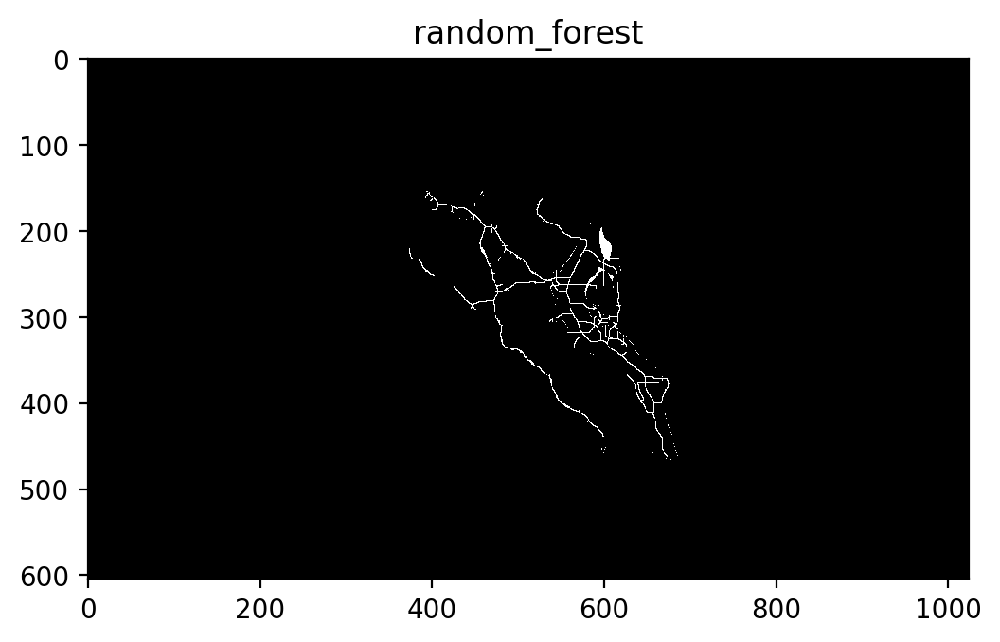

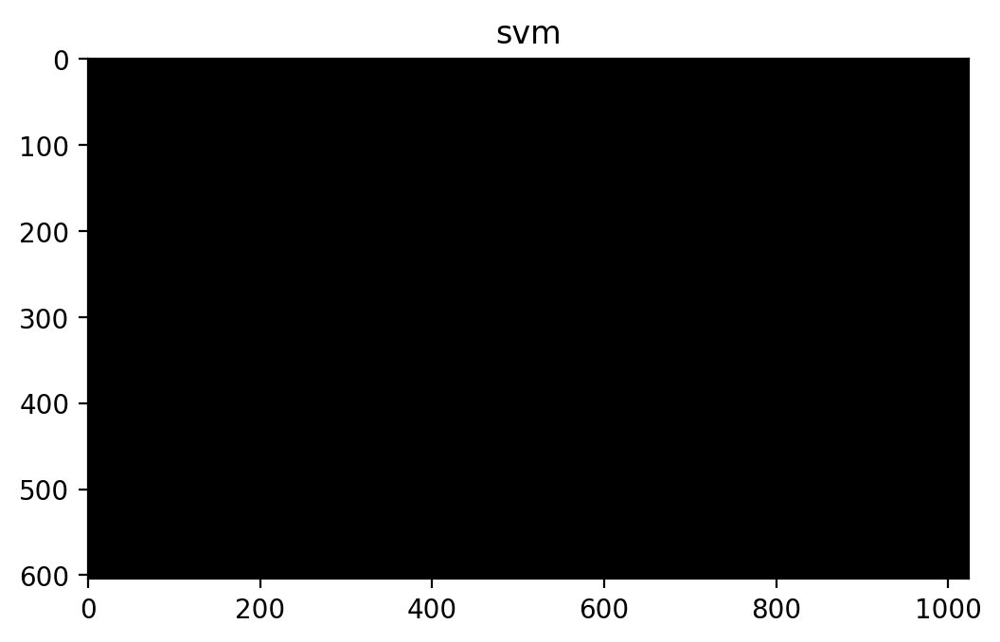

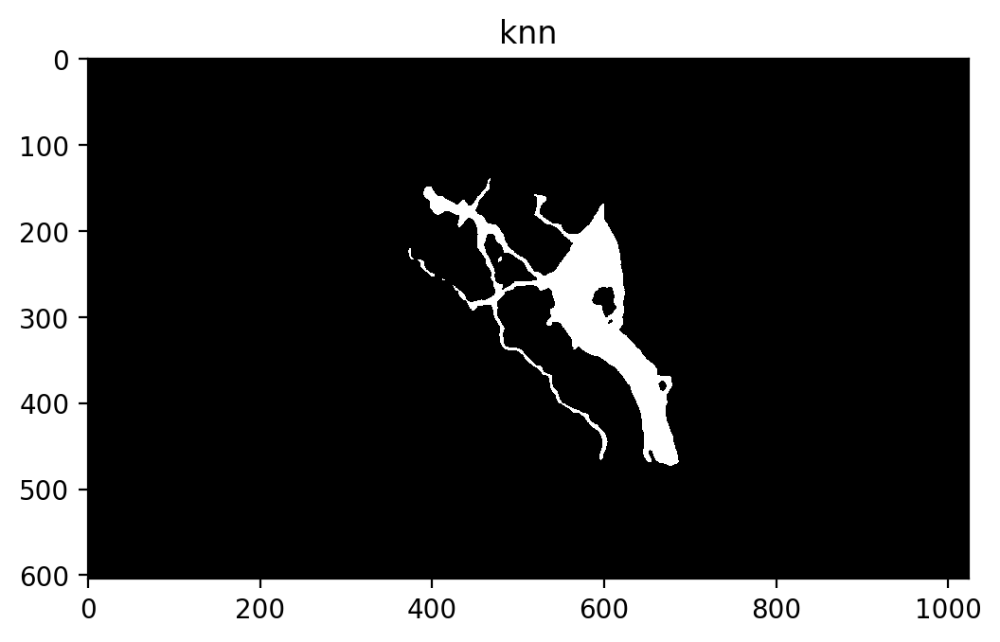

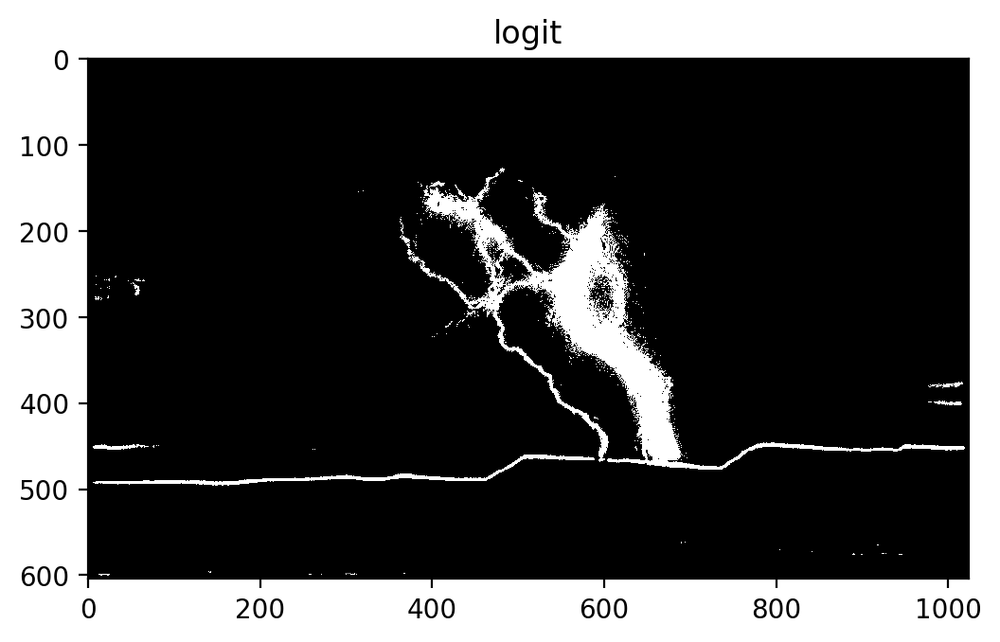

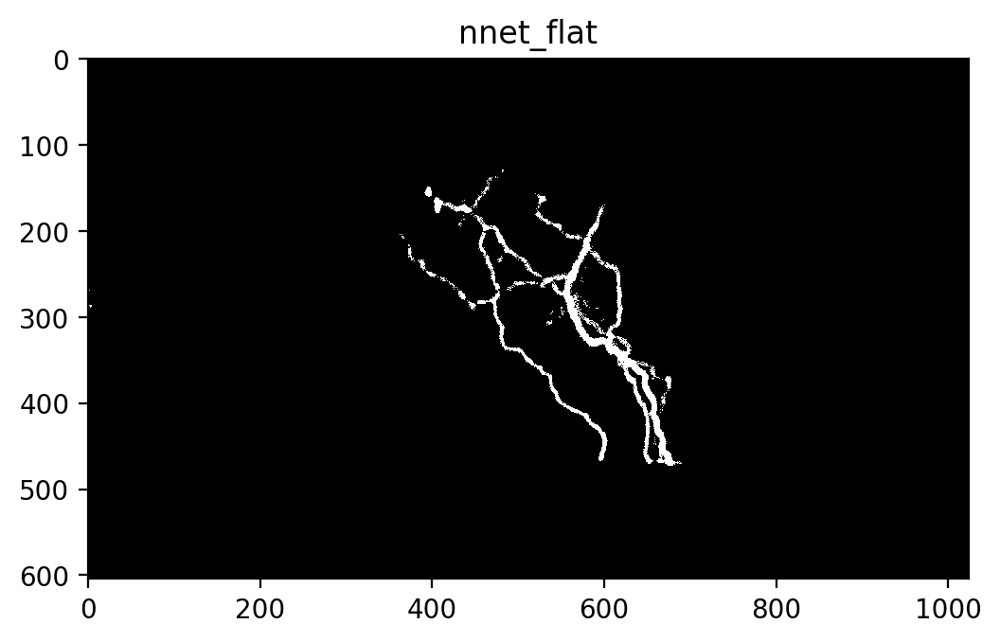

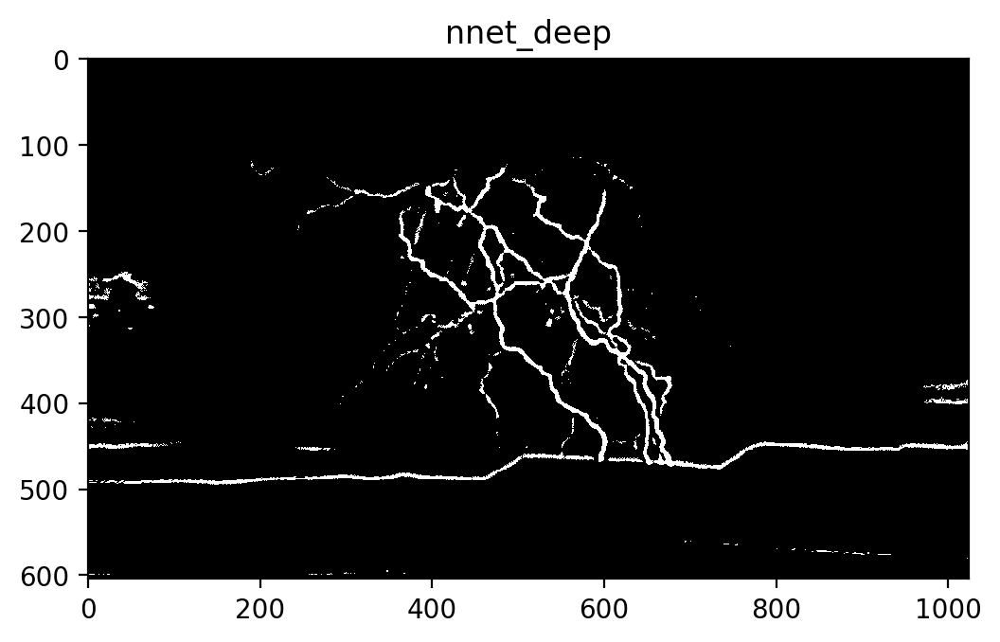

In [45]:
for name, classifier in classifiers.items():
    flattened_data = compiled_data.reshape(-1, compiled_data.shape[-1])
    predicted_labels = classifier.predict(flattened_data)
    predicted_labels = predicted_labels.reshape(compiled_data.shape[0], compiled_data.shape[1])

    show_image(predicted_labels)
    plt.title(name)

# Prune the Morse-Smale Complex

In [ ]:
# Fraction of points on an arc that need to be above the threshold
@interact(threshold=(0.0, 1.0))
def prune_msc(threshold):
    show_image(image)

    accepted_model = classifiers['logit']
    flattened_data = compiled_data.reshape(-1, compiled_data.shape[-1])
    predicted_labels = classifier.predict(flattened_data)
    predicted_labels = predicted_labels.reshape(compiled_data.shape[0], compiled_data.shape[1])

    accepted_arcs = set()
    for a in test_msc_coarse.arcs:
        indices = np.flip(np.array(a.line, dtype=int), axis=1)
        count = 0
        for row, col in indices:
            count += predicted_labels[row, col]
        if (count / indices.shape[0]) > threshold:
            plt.scatter(indices[:, 1], indices[:, 0], color=orange, s=1, marker=',', alpha=0.5)

    colors = [blue, green, red]
    for node in test_msc_coarse.nodes.values():
        if node.cellid in accepted_arcs:
            x, y = node.xy
            plt.scatter(x, y, color=colors[node.index], s=10)
    

interactive(children=(FloatSlider(value=0.5, description='threshold', max=1.0), Output()), _dom_classes=('widg…

In [ ]:
# Fraction of points on an arc that need to be above the threshold
@interact(threshold=(0.0, 1.0))
def prune_msc(threshold):
    show_image(image)

    accepted_model = classifiers['logit']
    flattened_data = compiled_data.reshape(-1, compiled_data.shape[-1])
    predicted_labels = classifier.predict(flattened_data)
    predicted_labels = predicted_labels.reshape(compiled_data.shape[0], compiled_data.shape[1])

    accepted_arcs = set()
    for a in test_msc_fine.arcs:
        indices = np.flip(np.array(a.line, dtype=int), axis=1)
        count = 0
        for row, col in indices:
            count += predicted_labels[row, col]
        if (count / indices.shape[0]) > threshold:
            plt.scatter(indices[:, 1], indices[:, 0], color=orange, s=1, marker=',', alpha=0.5)

    colors = [blue, green, red]
    for node in test_msc_fine.nodes.values():
        if node.cellid in accepted_arcs:
            x, y = node.xy
            plt.scatter(x, y, color=colors[node.index], s=10)
    